# PRACTICED BY KOLLURU SAHARSH
![image.png](attachment:image.png)
![image-2.png](attachment:image-2.png)
#MONEY LAUNDERING Testing

In [9]:
import numpy as np
import pandas as pd
import  matplotlib.pyplot as plt
import seaborn as sns

In [10]:
import warnings
warnings.filterwarnings('ignore')

In [11]:
df = pd.read_csv('MoneyLaundering.csv')

In [12]:
df.head()

,Time,Date,Sender_account,Receiver_account,Amount,Payment_currency,Received_currency,Sender_bank_location,Receiver_bank_location,Payment_type,Is_laundering,Laundering_type
0,10:35:19,2022-10-07,8724731955,2.769355e+09,1459.15,UK pounds,UK pounds,UK,UK,Cash Deposit,0.0,Normal_Cash_Deposits
1,10:35:20,2022-10-07,1491989064,8.401255e+09,6019.64,UK pounds,Dirham,UK,UAE,Cross-border,0.0,Normal_Fan_Out
2,10:35:20,2022-10-07,287305149,4.404767e+09,14328.44,UK pounds,UK pounds,UK,UK,Cheque,0.0,Normal_Small_Fan_Out
3,10:35:21,2022-10-07,5376652437,9.600420e+09,11895.00,UK pounds,UK pounds,UK,UK,ACH,0.0,Normal_Fan_In
4,10:35:21,2022-10-07,9614186178,3.803337e+09,115.25,UK pounds,UK pounds,UK,UK,Cash Deposit,0.0,Normal_Cash_Deposits


In [13]:
df.tail()

,Time,Date,Sender_account,Receiver_account,Amount,Payment_currency,Received_currency,Sender_bank_location,Receiver_bank_location,Payment_type,Is_laundering,Laundering_type
210151,15:05:59,2022-10-14,9309535432,6.036880e+09,1353.14,UK pounds,UK pounds,UK,UK,Cheque,0.0,Normal_Small_Fan_Out
210152,15:06:00,2022-10-14,873235144,8.012946e+09,6522.03,UK pounds,UK pounds,UK,UK,Cheque,0.0,Normal_Fan_Out
210153,15:06:01,2022-10-14,9819086477,6.597292e+09,2851.35,UK pounds,UK pounds,UK,UK,Cheque,0.0,Normal_Small_Fan_Out
210154,15:06:04,2022-10-14,1490045067,3.306293e+09,603.90,UK pounds,UK pounds,UK,UK,Cheque,0.0,Normal_Small_Fan_Out
210155,15:06:08,2022-10-14,291086082,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
df.shape

(210156, 12)

In [15]:
df.columns

Index(['Time', 'Date', 'Sender_account', 'Receiver_account', 'Amount',
       'Payment_currency', 'Received_currency', 'Sender_bank_location',
       'Receiver_bank_location', 'Payment_type', 'Is_laundering',
       'Laundering_type'],
      dtype='object')

In [16]:
df.duplicated().sum()

0

In [17]:
df.isnull().sum()

Time                      0
Date                      0
Sender_account            0
Receiver_account          1
Amount                    1
Payment_currency          1
Received_currency         1
Sender_bank_location      1
Receiver_bank_location    1
Payment_type              1
Is_laundering             1
Laundering_type           1
dtype: int64

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 210156 entries, 0 to 210155
Data columns (total 12 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Time                    210156 non-null  object 
 1   Date                    210156 non-null  object 
 2   Sender_account          210156 non-null  int64  
 3   Receiver_account        210155 non-null  float64
 4   Amount                  210155 non-null  float64
 5   Payment_currency        210155 non-null  object 
 6   Received_currency       210155 non-null  object 
 7   Sender_bank_location    210155 non-null  object 
 8   Receiver_bank_location  210155 non-null  object 
 9   Payment_type            210155 non-null  object 
 10  Is_laundering           210155 non-null  float64
 11  Laundering_type         210155 non-null  object 
dtypes: float64(3), int64(1), object(8)
memory usage: 19.2+ MB


In [19]:
df.describe()

,Sender_account,Receiver_account,Amount,Is_laundering
count,2.101560e+05,2.101550e+05,2.101550e+05,210155.000000
mean,4.986504e+09,5.081267e+09,8.718582e+03,0.001185
std,2.868518e+09,2.825649e+09,2.688244e+04,0.034401
min,9.217200e+04,4.823800e+04,8.830000e+00,0.000000
25%,2.552092e+09,2.670254e+09,2.113435e+03,0.000000
50%,4.928925e+09,5.134701e+09,6.124700e+03,0.000000
75%,7.447120e+09,7.503742e+09,1.042665e+04,0.000000
max,9.999706e+09,9.999971e+09,6.213932e+06,1.000000


In [20]:
df.nunique()

Time                       70455
Date                           8
Sender_account             31601
Receiver_account           89410
Amount                    194773
Payment_currency              13
Received_currency             13
Sender_bank_location          18
Receiver_bank_location        18
Payment_type                   8
Is_laundering                  2
Laundering_type               27
dtype: int64

In [21]:
object_columns = df.select_dtypes(include=['object', 'bool']).columns
print("Object type columns:")
print(object_columns)

numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
print("\nNumerical type columns:")
print(numerical_columns)

Object type columns:
Index(['Time', 'Date', 'Payment_currency', 'Received_currency',
       'Sender_bank_location', 'Receiver_bank_location', 'Payment_type',
       'Laundering_type'],
      dtype='object')

Numerical type columns:
Index(['Sender_account', 'Receiver_account', 'Amount', 'Is_laundering'], dtype='object')


In [22]:
def classify_features(df):
    categorical_features = []
    non_categorical_features = []
    discrete_features = []
    continuous_features = []

    for column in df.columns:
        if df[column].dtype in ['object', 'bool']:
            if df[column].nunique() < 15:
                categorical_features.append(column)
            else:
                non_categorical_features.append(column)
        elif df[column].dtype in ['int64', 'float64']:
            if df[column].nunique() < 10:
                discrete_features.append(column)
            else:
                continuous_features.append(column)

    return categorical_features, non_categorical_features, discrete_features, continuous_features

In [23]:
categorical, non_categorical, discrete, continuous = classify_features(df)

# New Section

In [24]:
print("Categorical Features:", categorical)
print("Non-Categorical Features:", non_categorical)
print("Discrete Features:", discrete)
print("Continuous Features:", continuous)

Categorical Features: ['Date', 'Payment_currency', 'Received_currency', 'Payment_type']
Non-Categorical Features: ['Time', 'Sender_bank_location', 'Receiver_bank_location', 'Laundering_type']
Discrete Features: ['Is_laundering']
Continuous Features: ['Sender_account', 'Receiver_account', 'Amount']


In [25]:
for i in categorical:
    print(i, ':')
    print(df[i].unique())
    print()

Date :
['2022-10-07' '2022-10-08' '2022-10-09' '2022-10-10' '2022-10-11'
 '2022-10-12' '2022-10-13' '2022-10-14']

Payment_currency :
['UK pounds' 'Indian rupee' 'Albanian lek' 'Swiss franc' 'Pakistani rupee'
 'Naira' 'Yen' 'Euro' 'Dirham' 'Mexican Peso' 'Turkish lira' 'US dollar'
 'Moroccan dirham' nan]

Received_currency :
['UK pounds' 'Dirham' 'Pakistani rupee' 'Euro' 'US dollar' 'Mexican Peso'
 'Indian rupee' 'Albanian lek' 'Turkish lira' 'Naira' 'Swiss franc' 'Yen'
 'Moroccan dirham' nan]

Payment_type :
['Cash Deposit' 'Cross-border' 'Cheque' 'ACH' 'Credit card' 'Debit card'
 'Cash Withdrawal' 'Cross-border Withdrawal' nan]



In [26]:
for i in categorical:
    print(i, ':')
    print(df[i].value_counts())
    print()

Date :
2022-10-13    31810
2022-10-08    29023
2022-10-09    28880
2022-10-11    28704
2022-10-12    28684
2022-10-10    27345
2022-10-07    20892
2022-10-14    14818
Name: Date, dtype: int64

Payment_currency :
UK pounds          201021
Euro                 2933
US dollar             840
Swiss franc           728
Moroccan dirham       684
Albanian lek          605
Turkish lira          600
Yen                   588
Indian rupee          466
Mexican Peso          433
Pakistani rupee       430
Dirham                417
Naira                 410
Name: Payment_currency, dtype: int64

Received_currency :
UK pounds          194793
Euro                 4724
Mexican Peso         1349
Turkish lira         1205
US dollar            1141
Naira                1076
Pakistani rupee      1000
Albanian lek          976
Dirham                851
Indian rupee          830
Yen                   754
Swiss franc           729
Moroccan dirham       727
Name: Received_currency, dtype: int64

Payment_type :


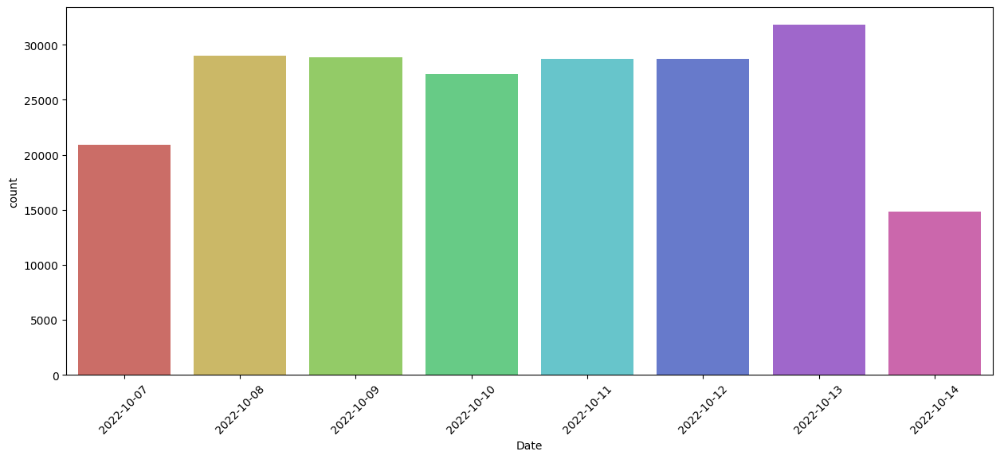

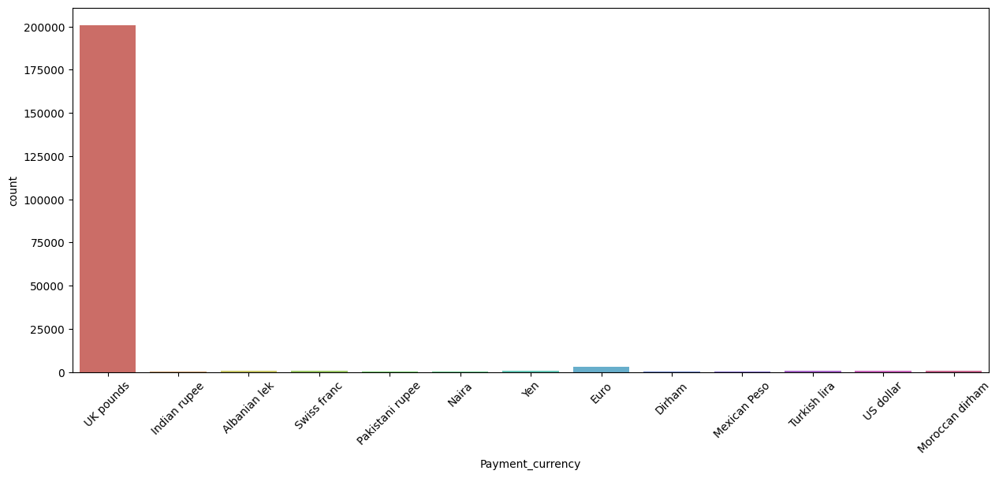

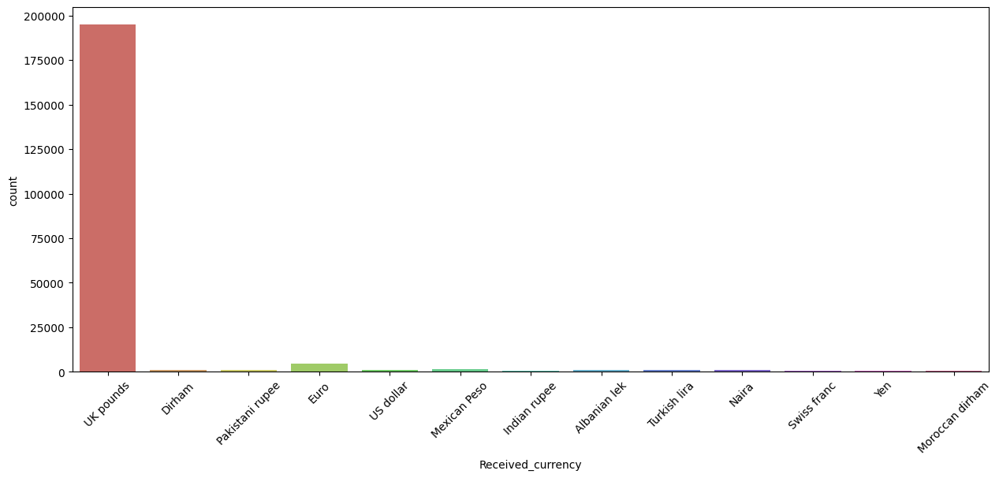

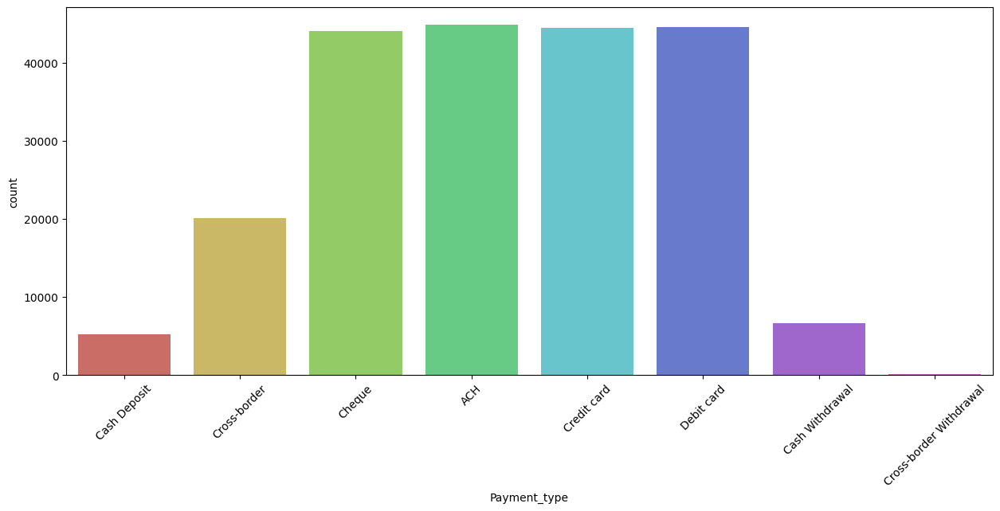

In [27]:
for i in categorical:
    plt.figure(figsize=(15, 6))
    sns.countplot(x=i, data=df, palette='hls')
    plt.xticks(rotation = 45)
    plt.show()

In [28]:
import plotly.express as px

In [29]:
for i in categorical:
    fig = px.pie(df, names=i)
    print('Pieplot for:', i)
    fig.show()

Pieplot for: Date


Pieplot for: Payment_currency


Pieplot for: Received_currency


Pieplot for: Payment_type


In [30]:
for i in discrete:
    print(i, ':')
    print(df[i].unique())
    print()

Is_laundering :
[ 0.  1. nan]



In [31]:
for i in discrete:
    print(i, ':')
    print(df[i].value_counts())
    print()

Is_laundering :
0.0    209906
1.0       249
Name: Is_laundering, dtype: int64



In [32]:
for i in discrete:
    plt.figure(figsize=(15,6))
    sns.countplot(df[i], data = df, palette='hls')
    plt.show()

TypeError: ignored

<Figure size 1500x600 with 0 Axes>

In [33]:
for i in discrete:
    fig = px.pie(df, names=i)
    print('Pieplot for:', i)
    fig.show()

Pieplot for: Is_laundering


In [ ]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.histplot(df[i], bins = 20, kde = True, palette='hls')
    plt.xticks(rotation = 90)
    plt.show()

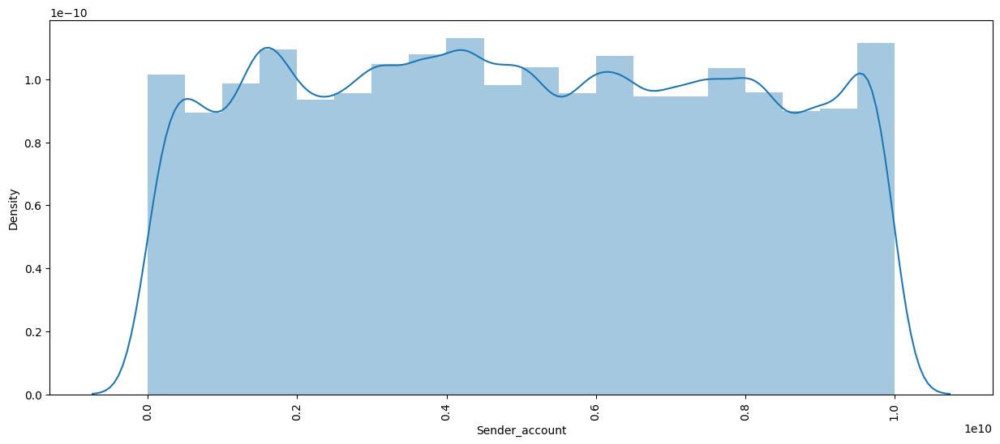

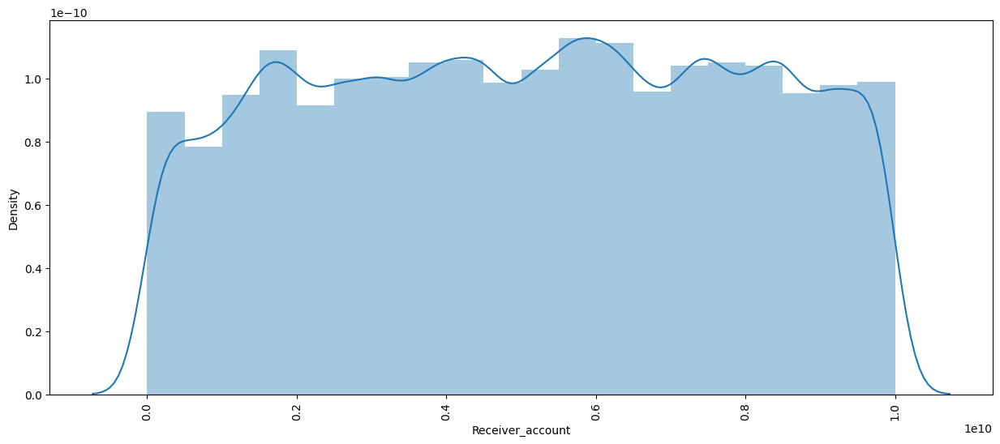

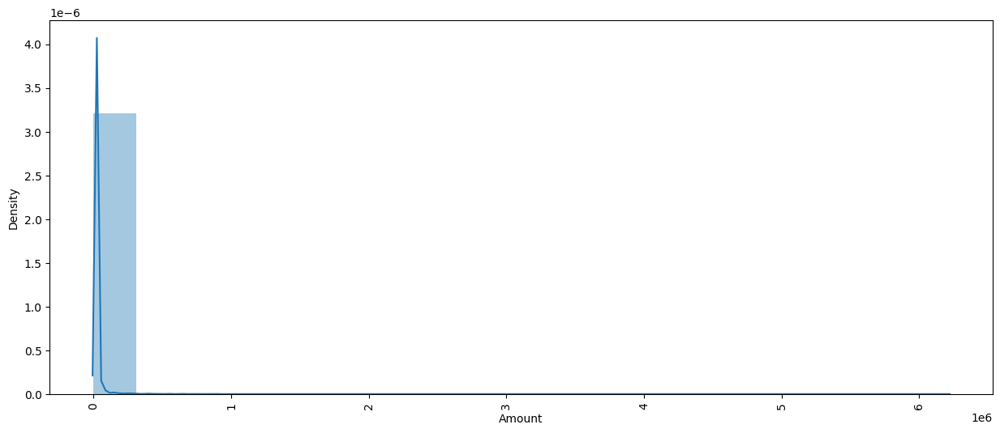

In [34]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.distplot(df[i], bins = 20, kde = True)
    plt.xticks(rotation = 90)
    plt.show()

In [ ]:
continuous = ['Amount']

for i in continuous:
    plt.figure(figsize=(15,6))
    sns.boxplot(df[i], palette='hls')
    plt.xticks(rotation = 90)
    plt.show()

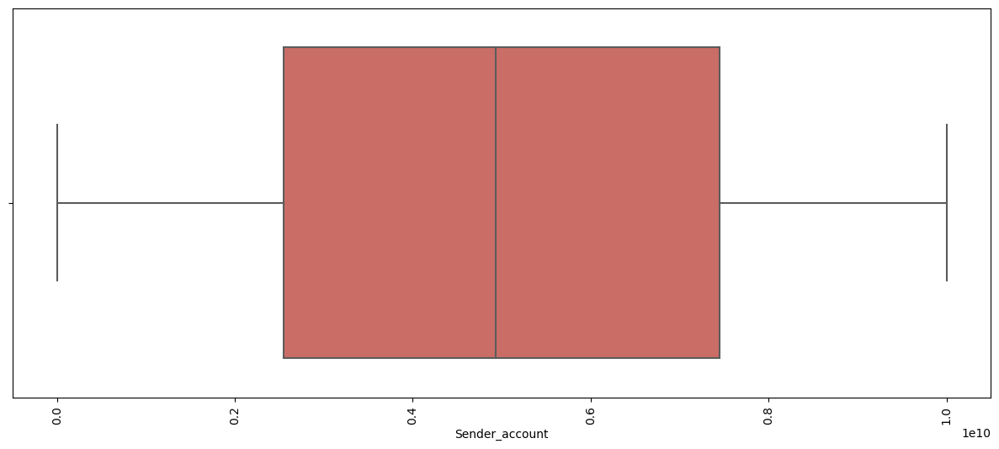

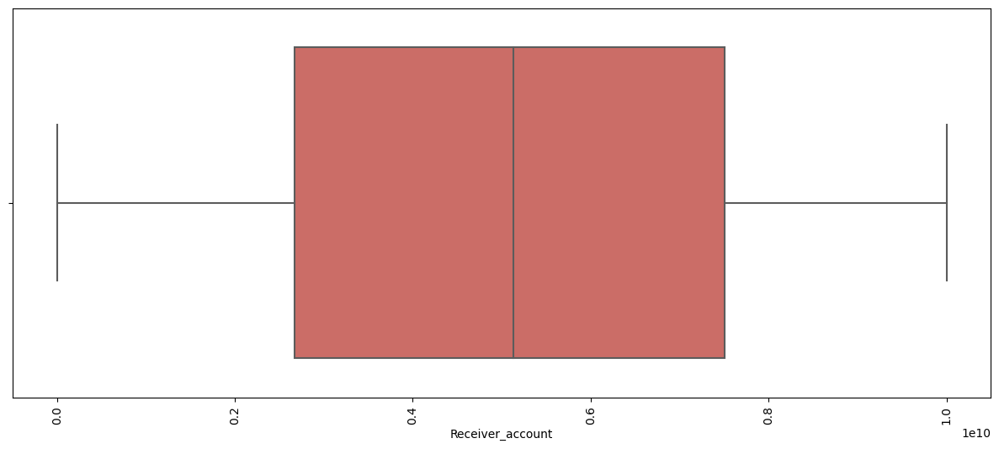

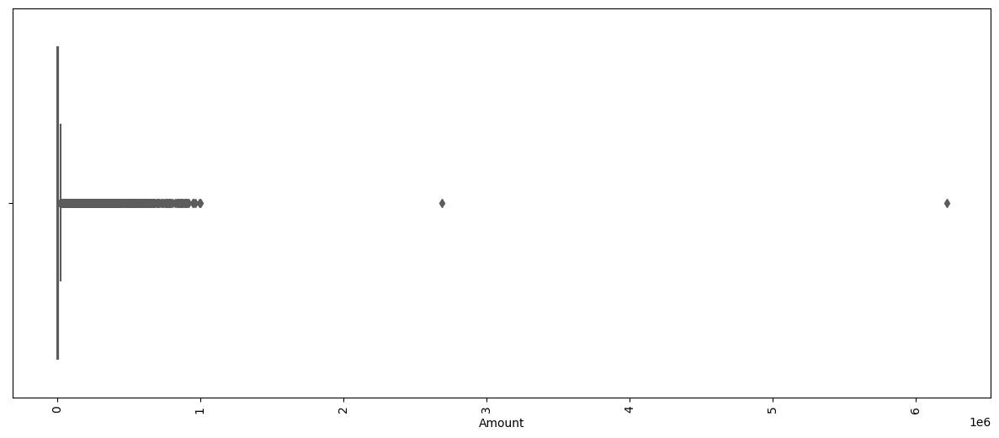

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'continuous' is a list of column names
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.boxplot(x=i, data=df, palette='hls')  # Corrected line
    plt.xticks(rotation=90)
    plt.show()


In [36]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.violinplot(i, data = df, palette='hls')
    sns.violinplot(i, data = df[i], palette='hls')
    plt.xticks(rotation = 90)
    plt.show()

TypeError: ignored

<Figure size 1500x600 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'continuous' is a list of column names
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.violinplot(x=i, data=df, palette='hls')  # Corrected line
    plt.xticks(rotation=90)
    plt.show()


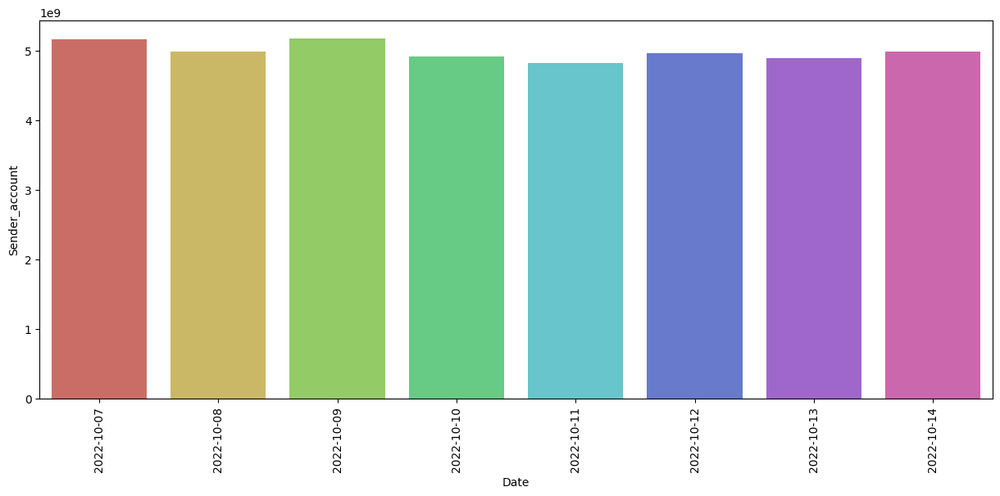

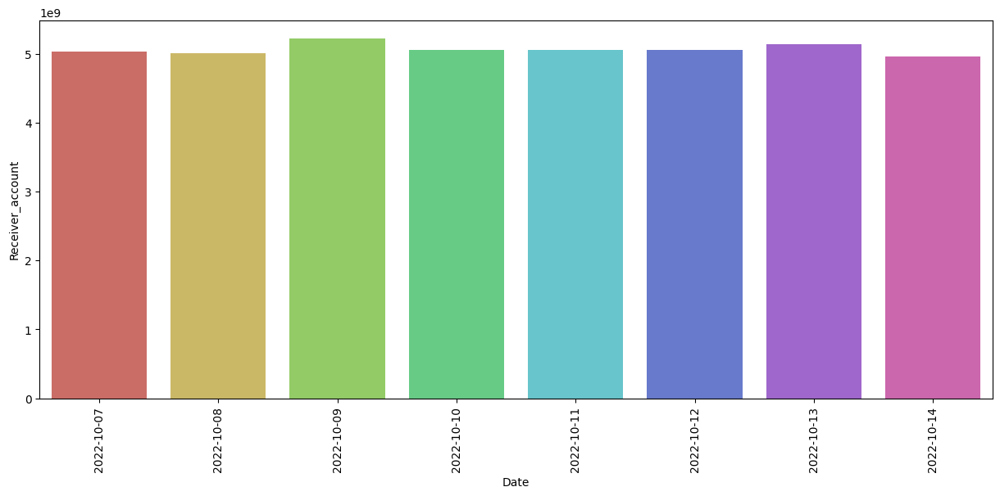

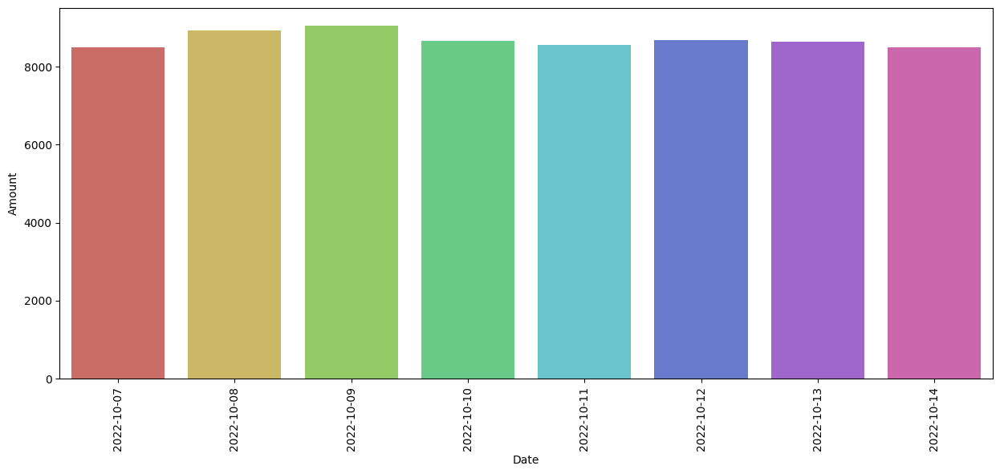

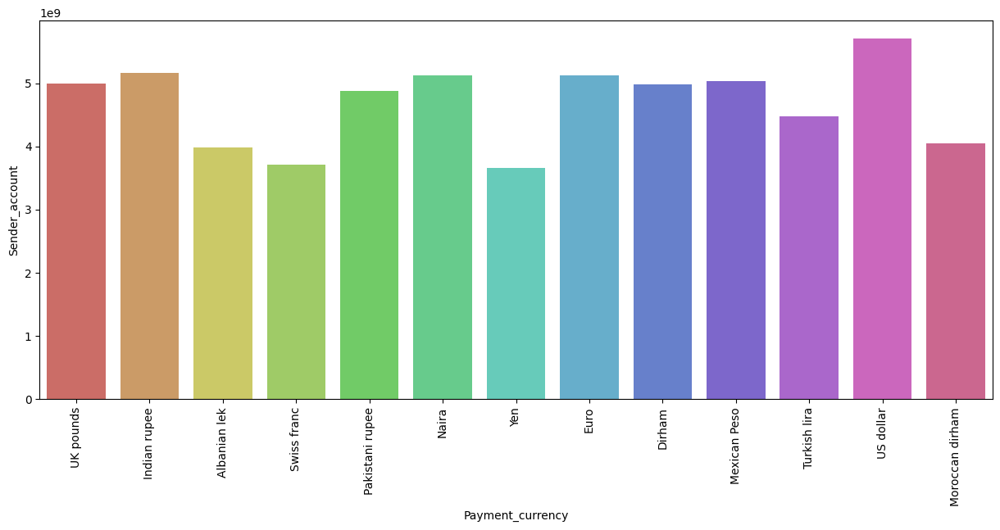

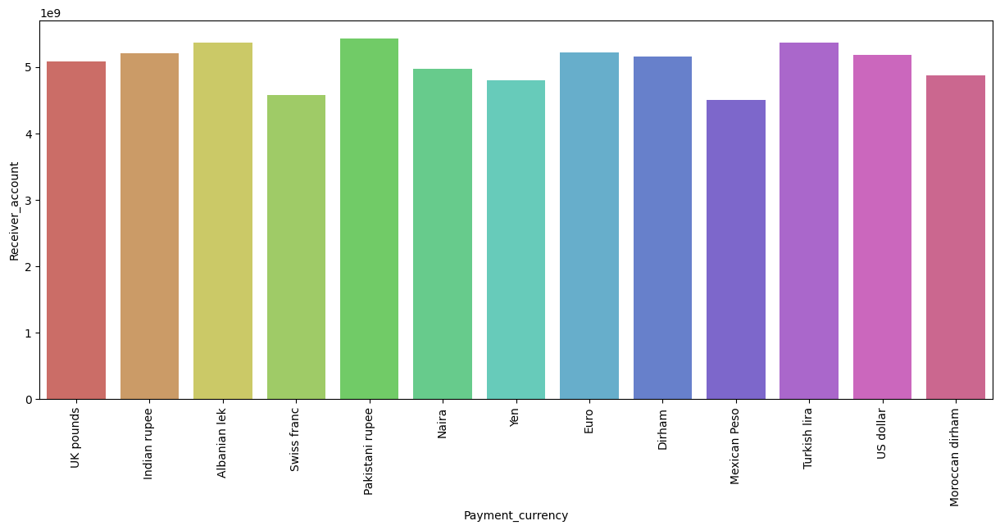

...

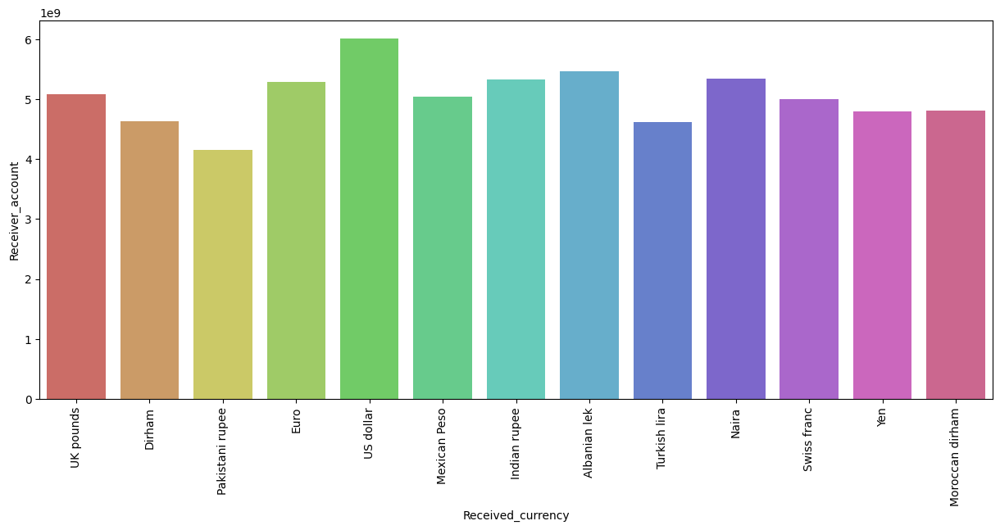

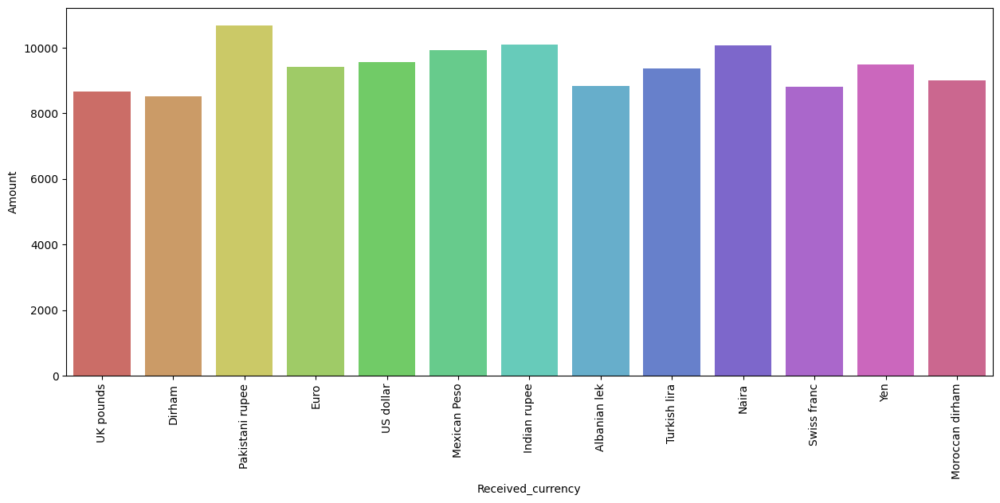

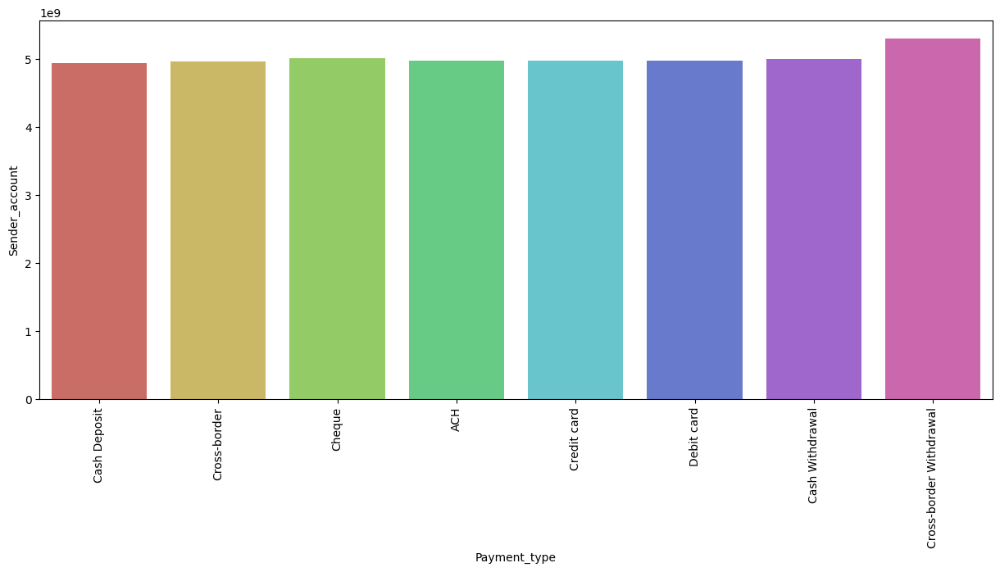

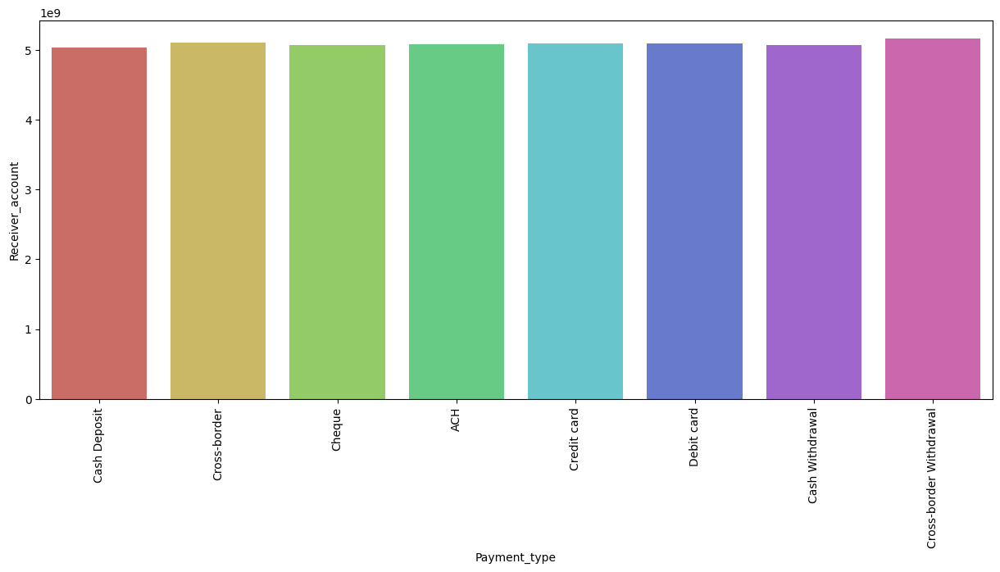

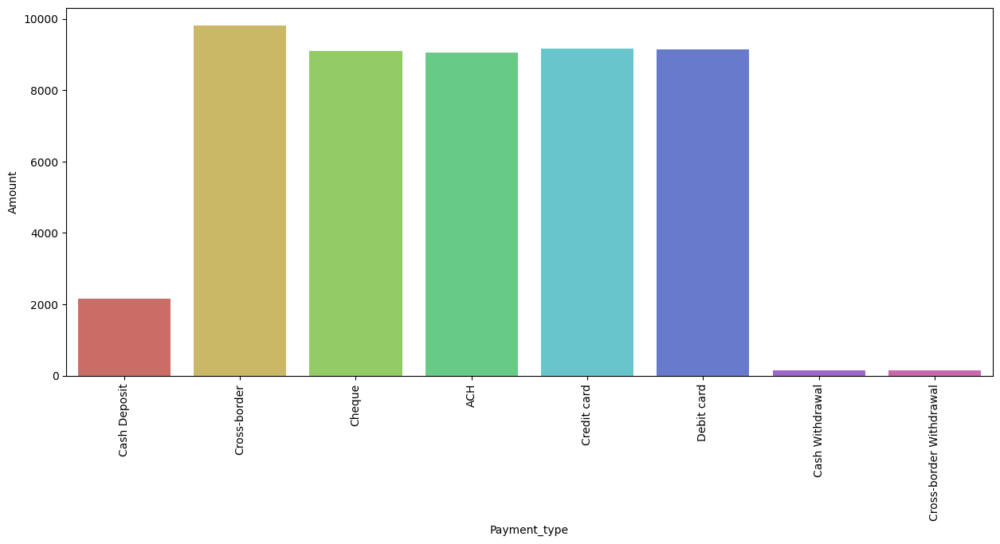

In [37]:
for i in categorical:
    for j in continuous:
        plt.figure(figsize=(15,6))
        sns.barplot(x = i, y = j, data = df, ci = None, palette='hls')
        plt.xticks(rotation = 90)
        plt.show()

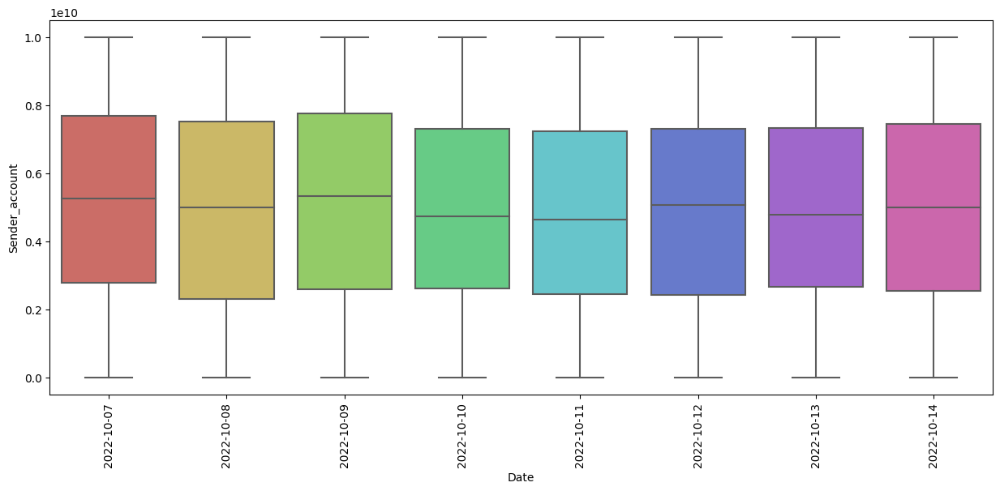

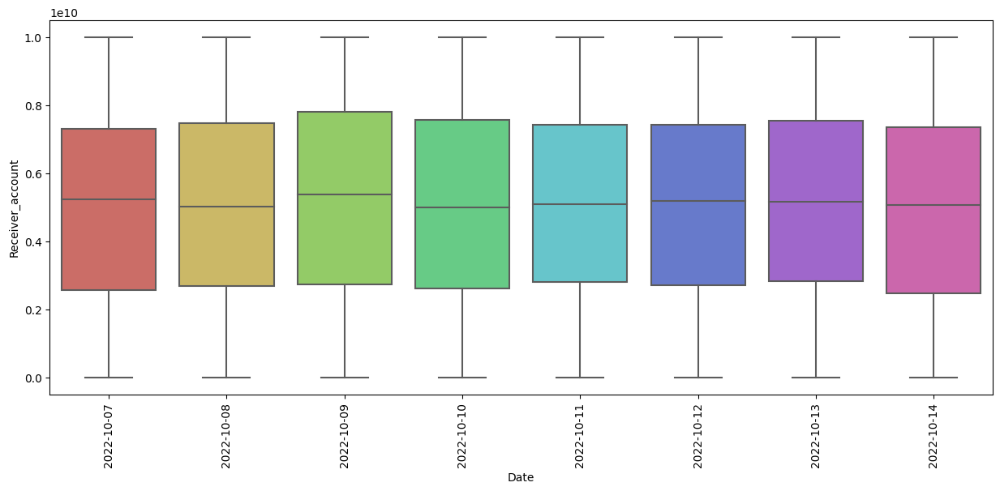

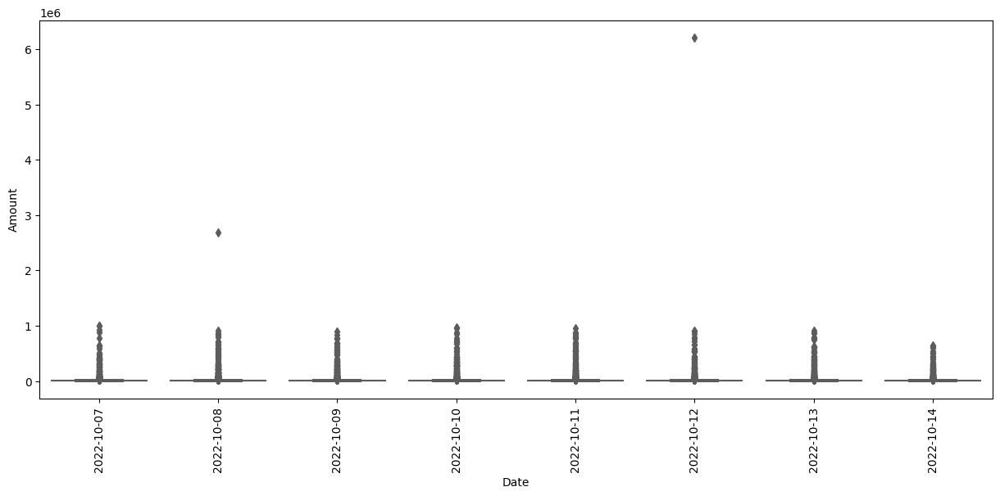

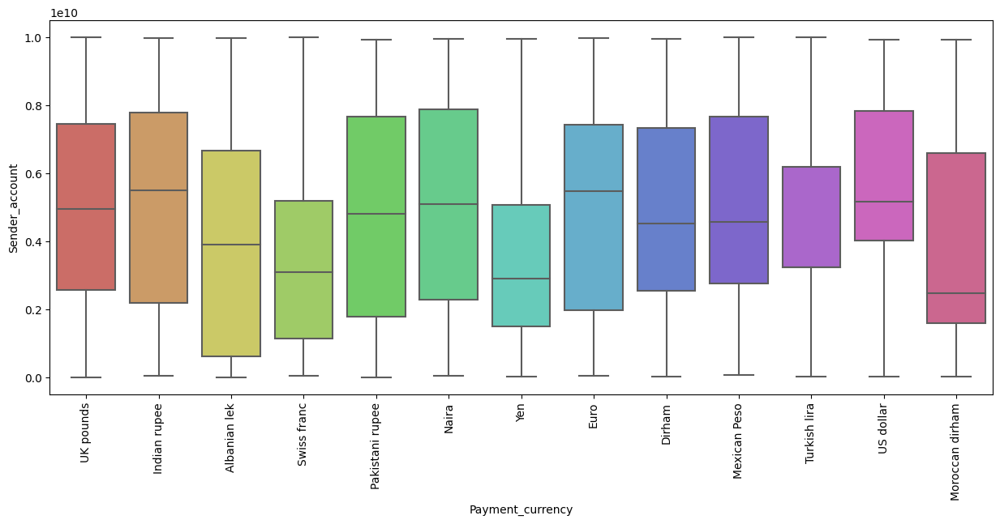

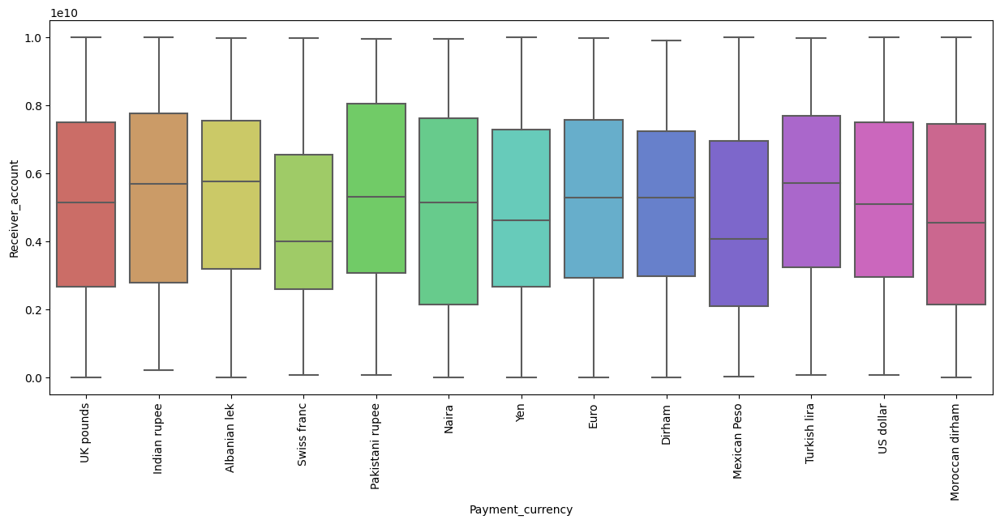

...

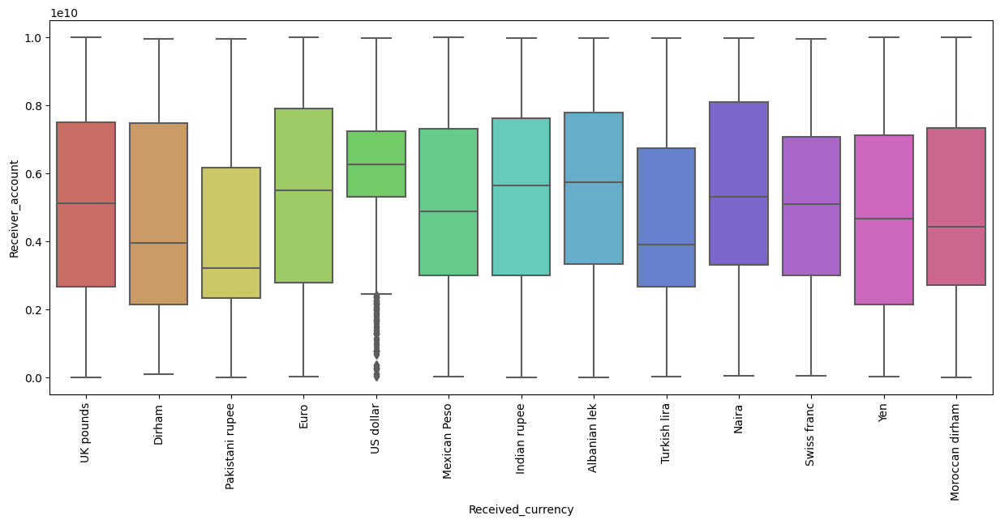

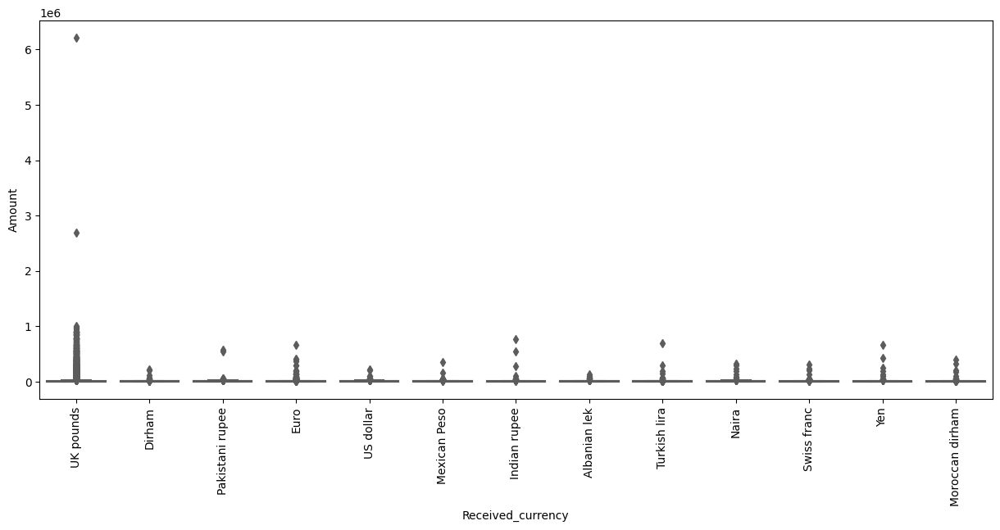

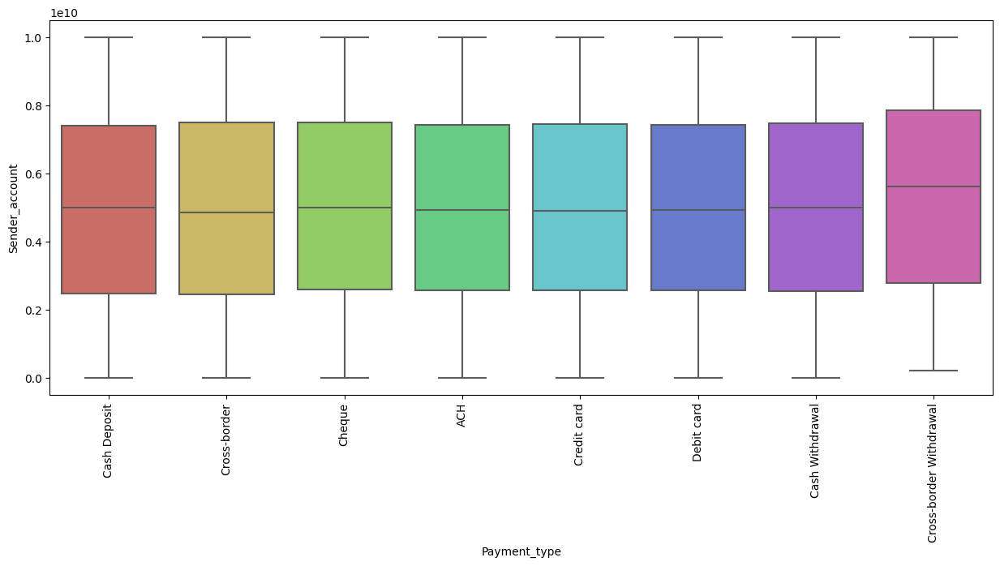

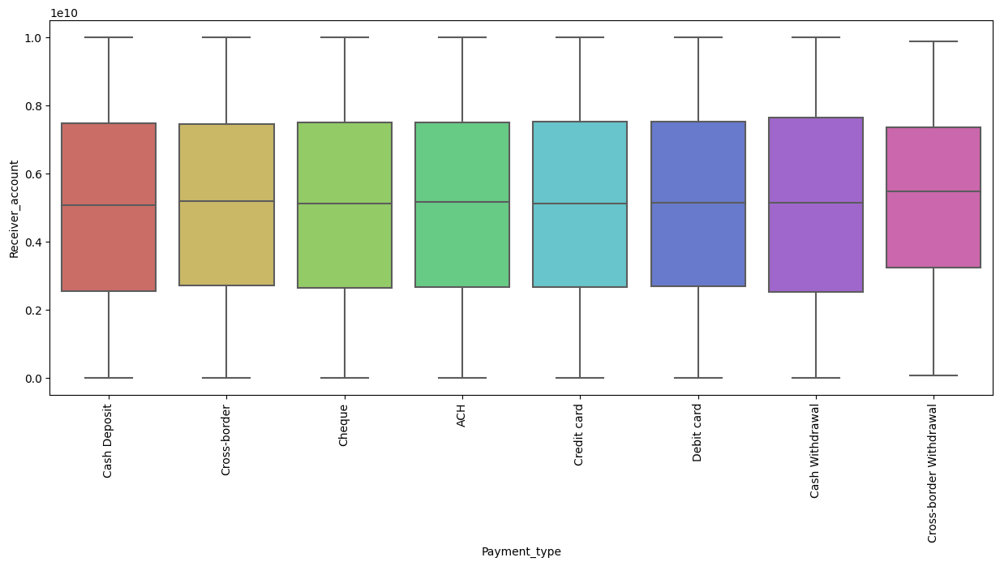

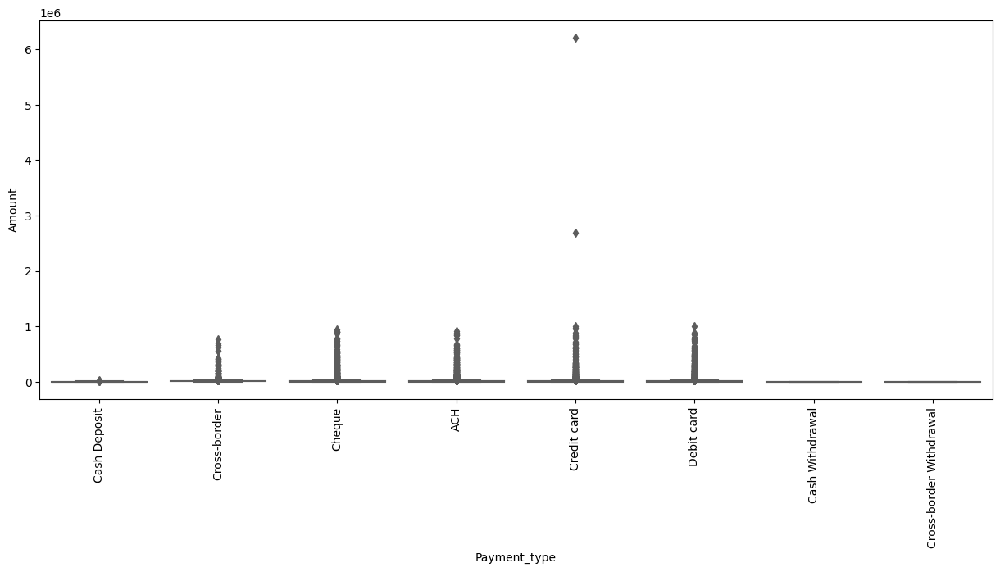

In [38]:
for i in categorical:
    for j in continuous:
        plt.figure(figsize=(15,6))
        sns.boxplot(x = i, y = j, data = df, palette='hls')
        plt.xticks(rotation = 90)
        plt.show()

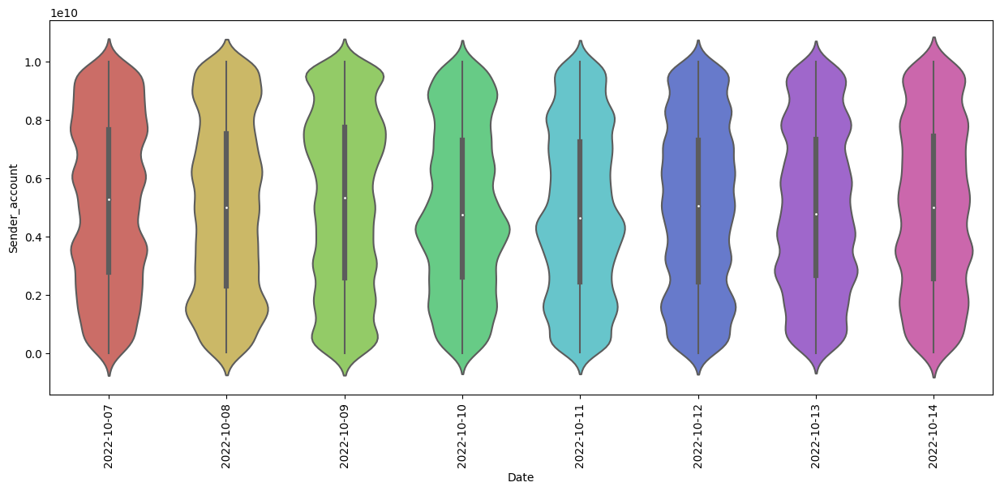

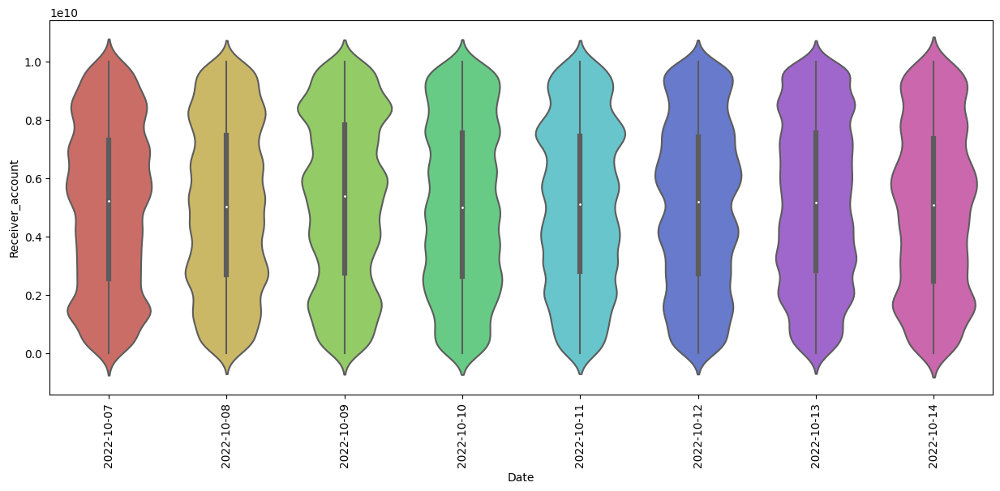

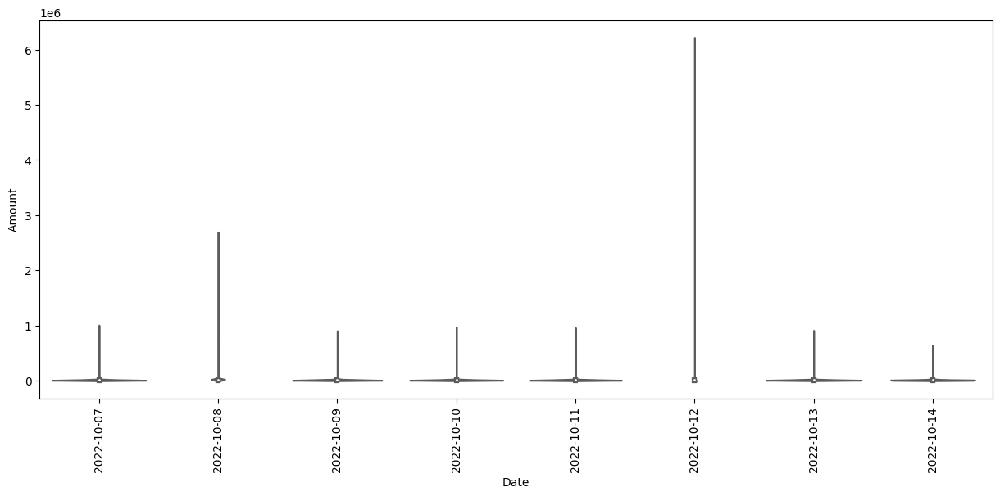

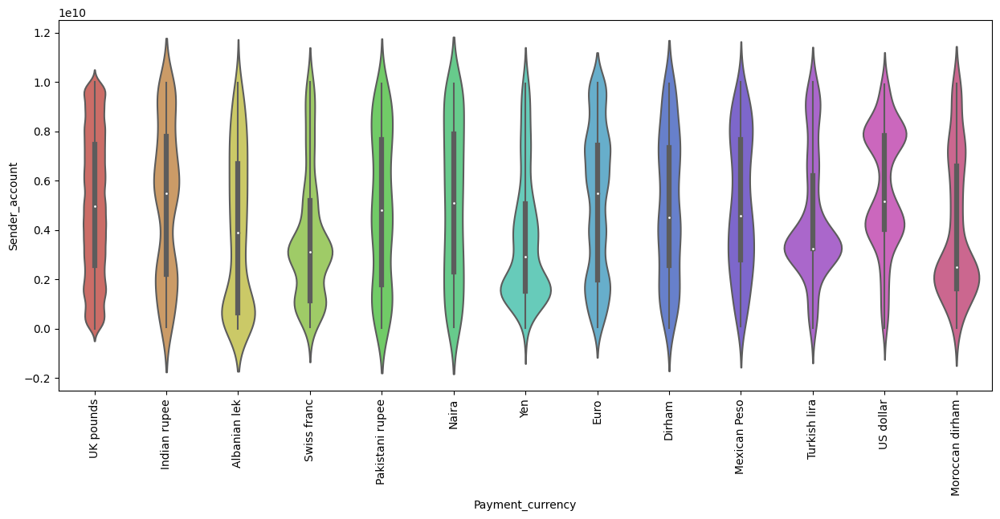

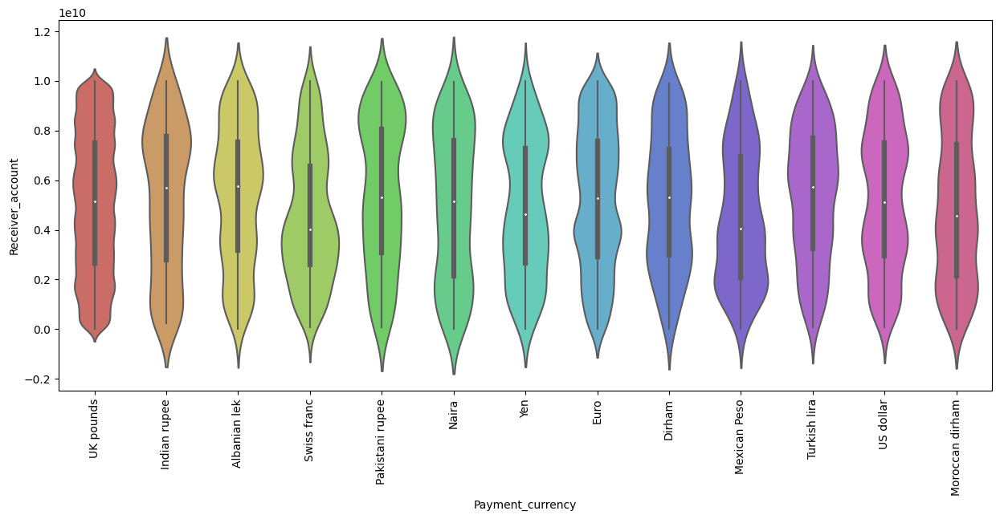

...

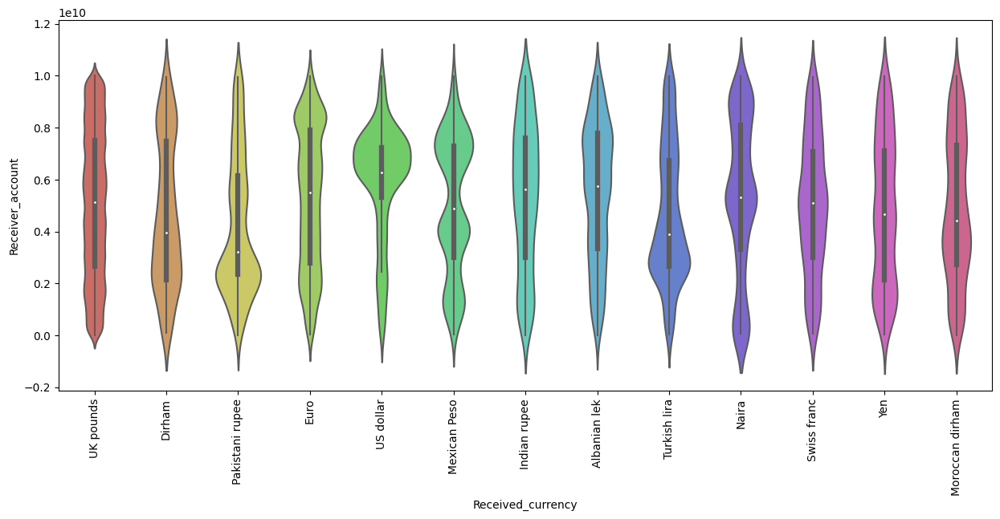

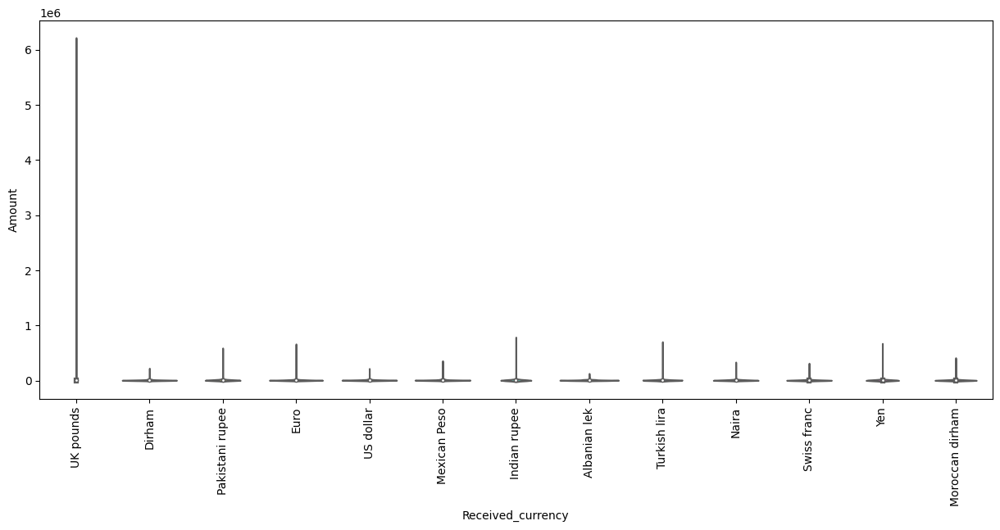

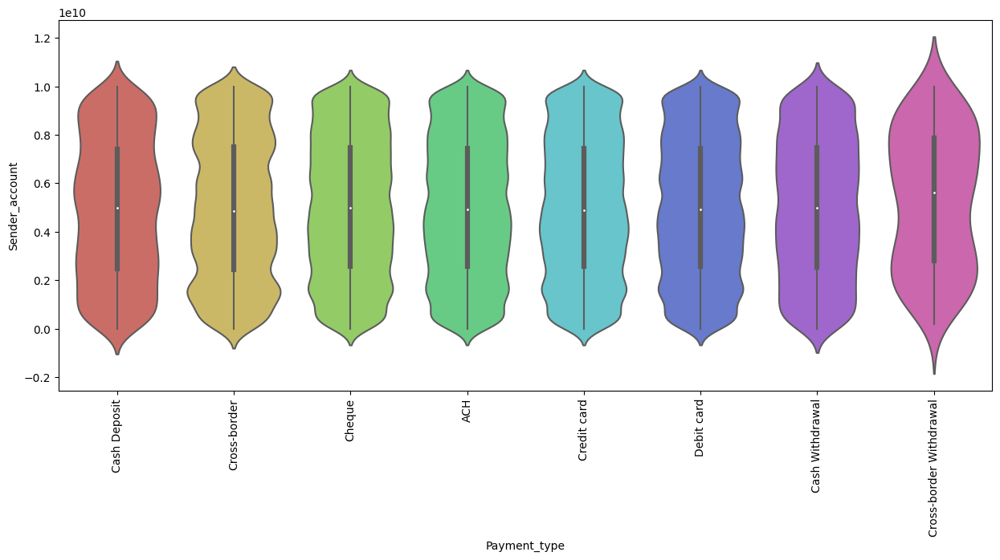

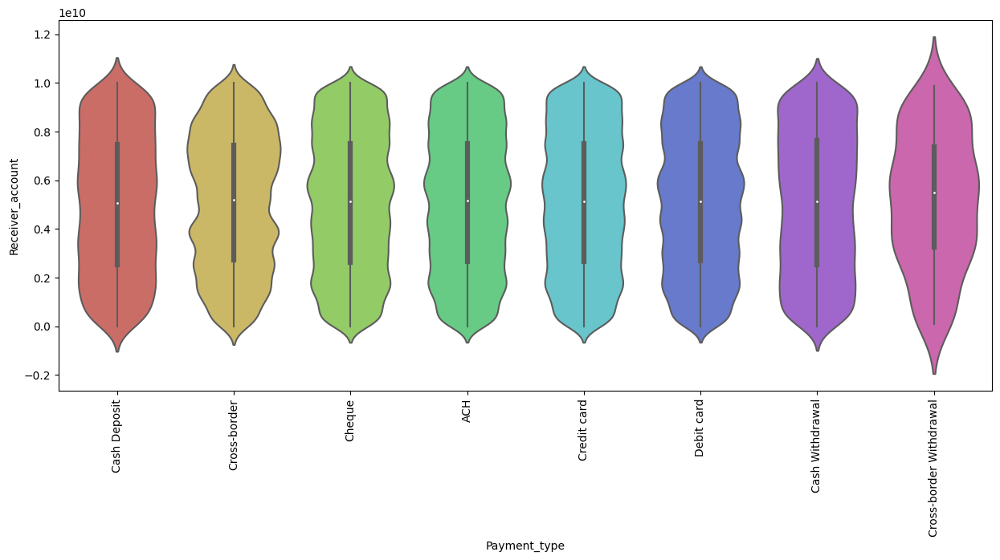

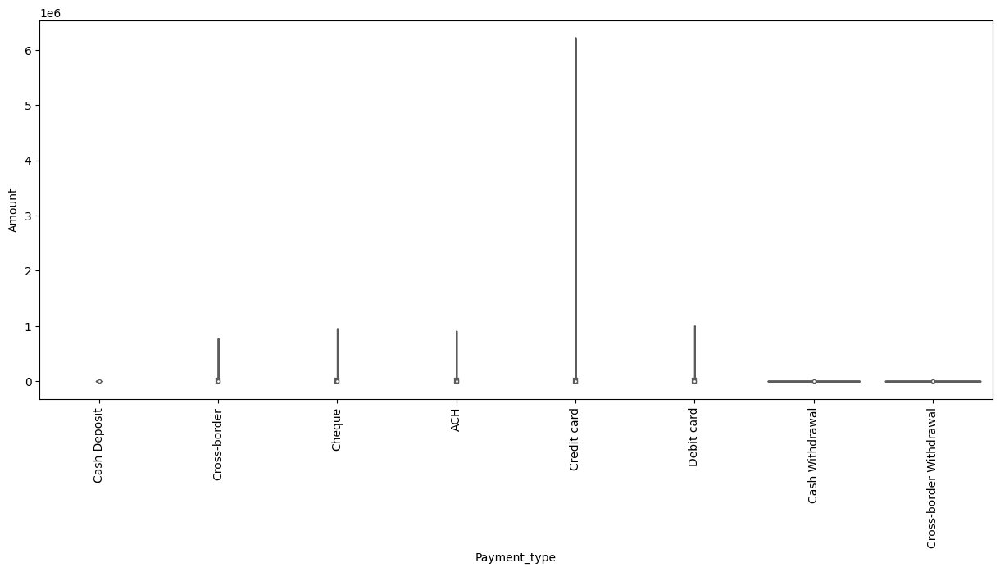

In [39]:
for i in categorical:
    for j in continuous:
        plt.figure(figsize=(15,6))
        sns.violinplot(x = i, y = j, data = df, palette='hls')
        plt.xticks(rotation = 90)
        plt.show()

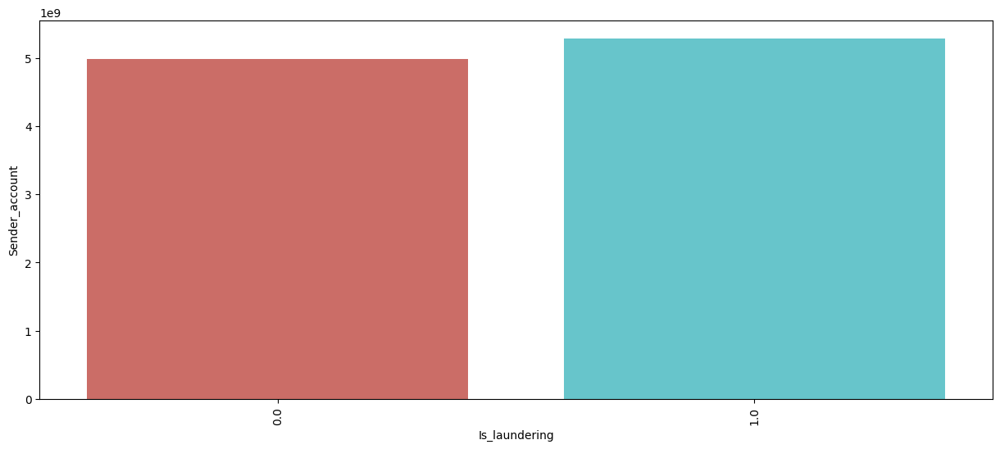

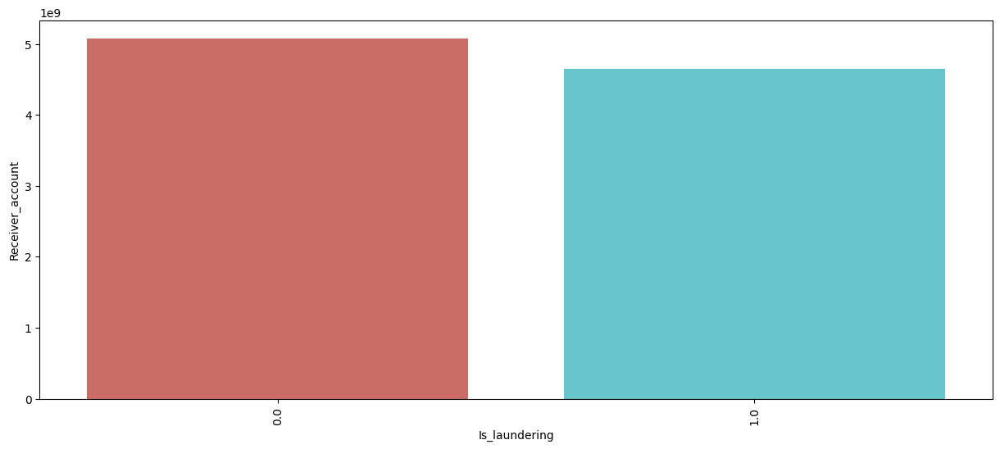

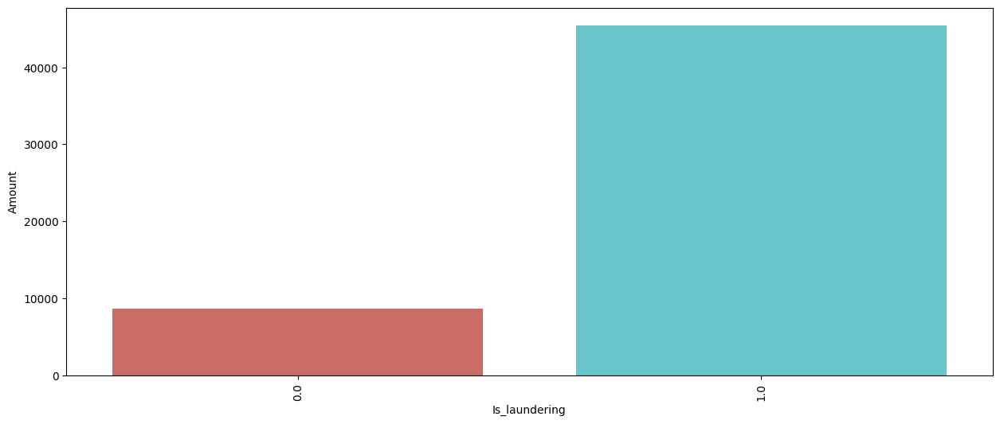

In [40]:
for i in discrete:
    for j in continuous:
        plt.figure(figsize=(15,6))
        sns.barplot(x = i, y = j, data = df, ci = None, palette='hls')
        plt.xticks(rotation = 90)
        plt.show()

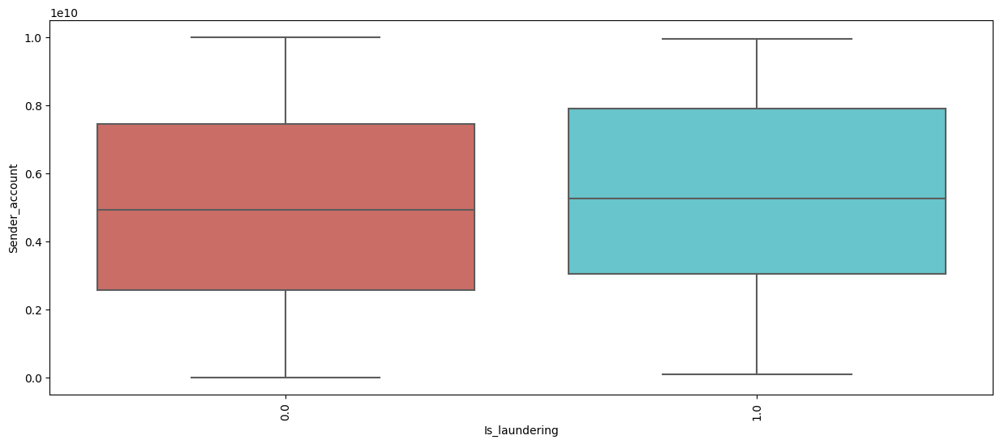

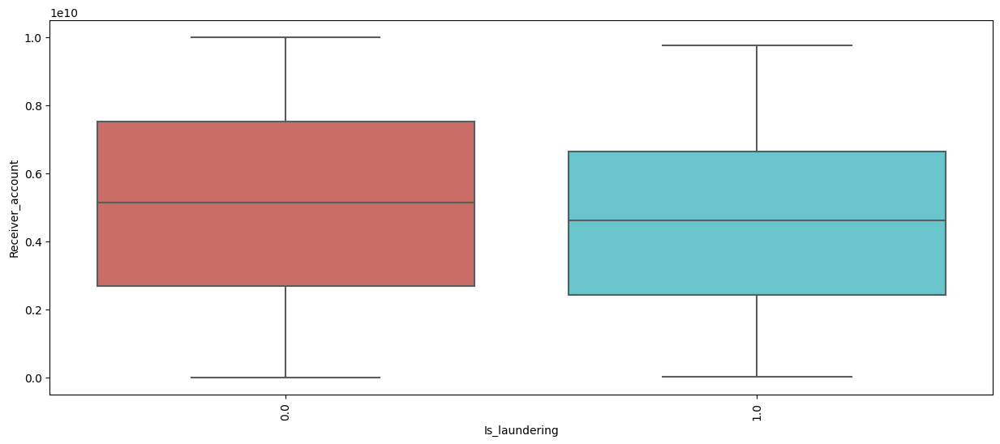

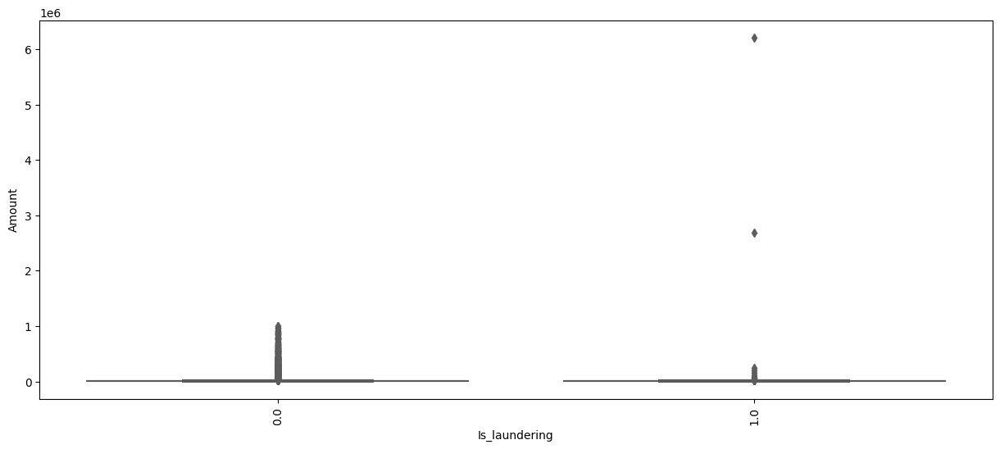

In [41]:
for i in discrete:
    for j in continuous:
        plt.figure(figsize=(15,6))
        sns.boxplot(x = i, y = j, data = df, palette='hls')
        plt.xticks(rotation = 90)
        plt.show()

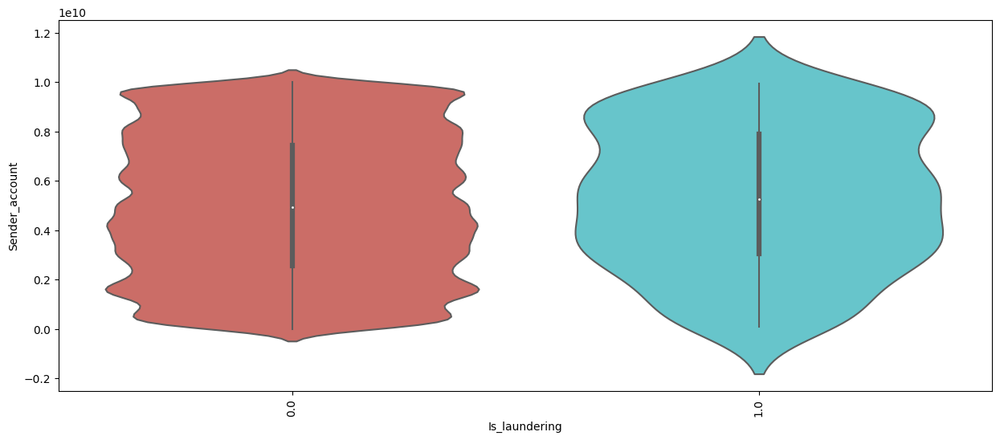

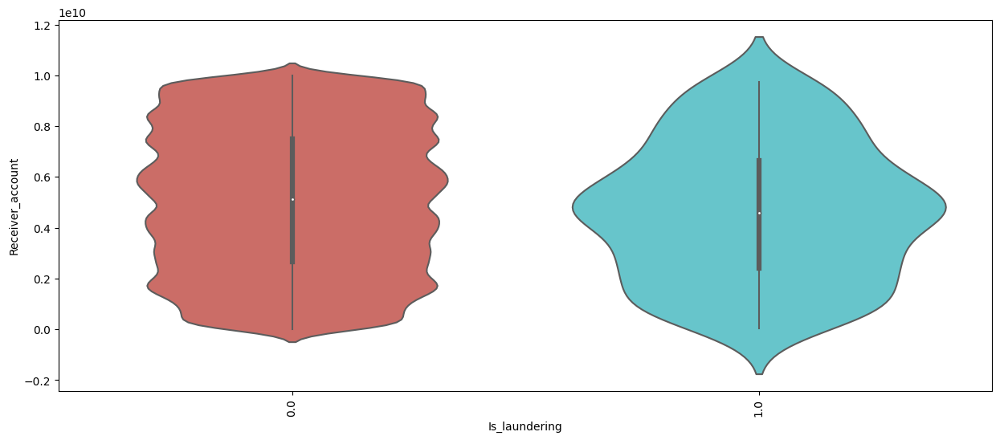

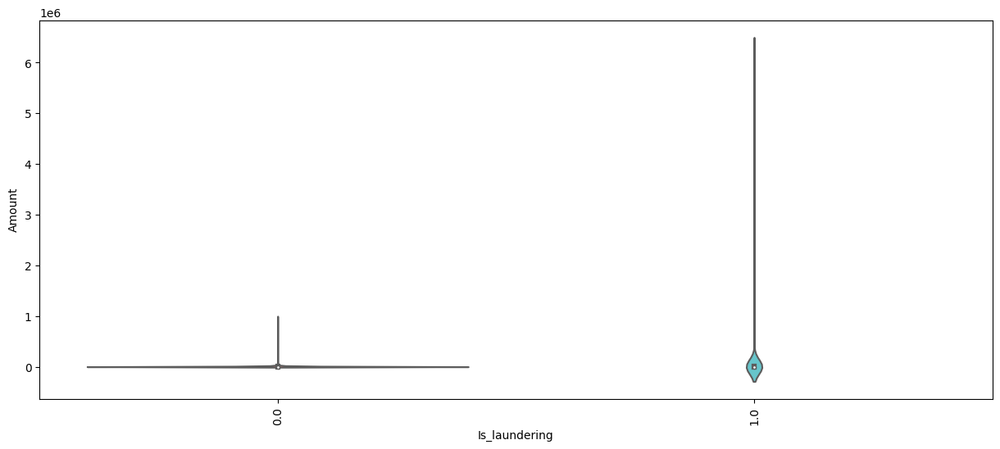

In [42]:
for i in discrete:
    for j in continuous:
        plt.figure(figsize=(15,6))
        sns.violinplot(x = i, y = j, data = df, palette='hls')
        plt.xticks(rotation = 90)
        plt.show()

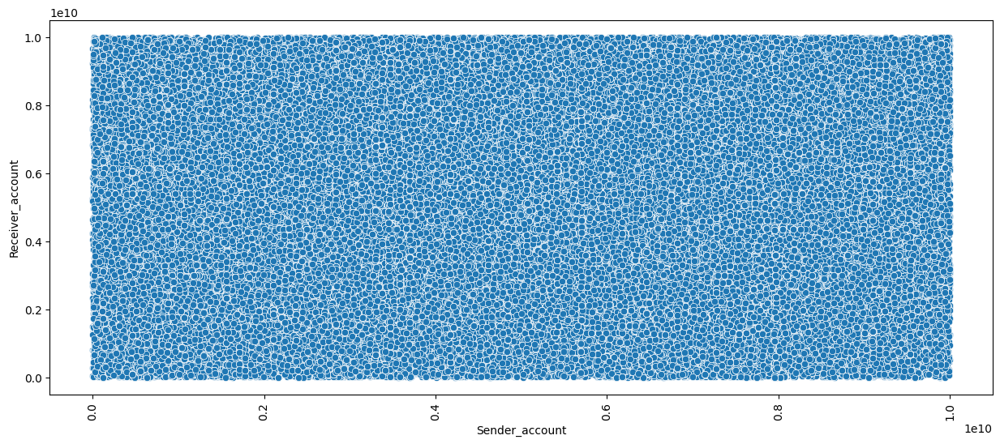

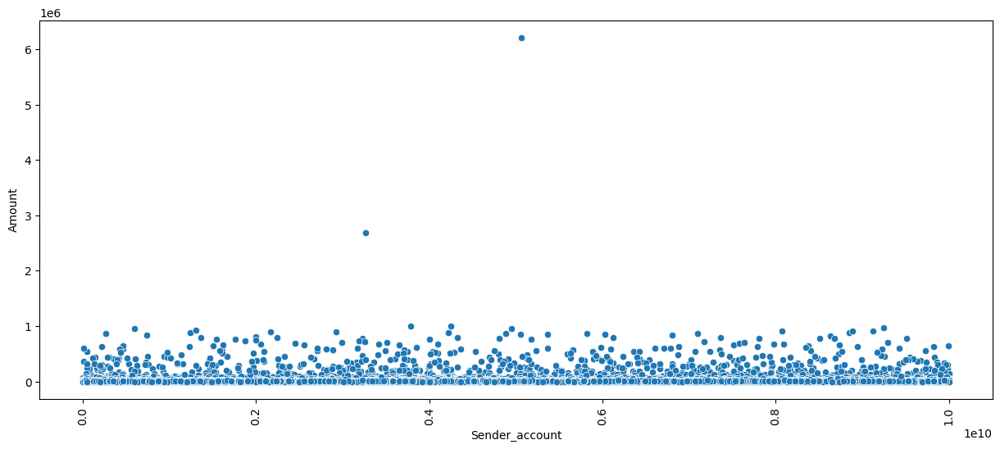

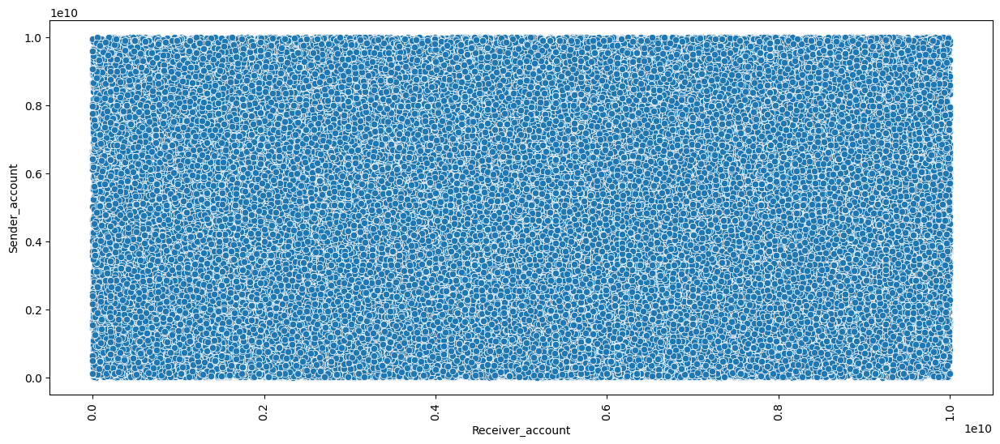

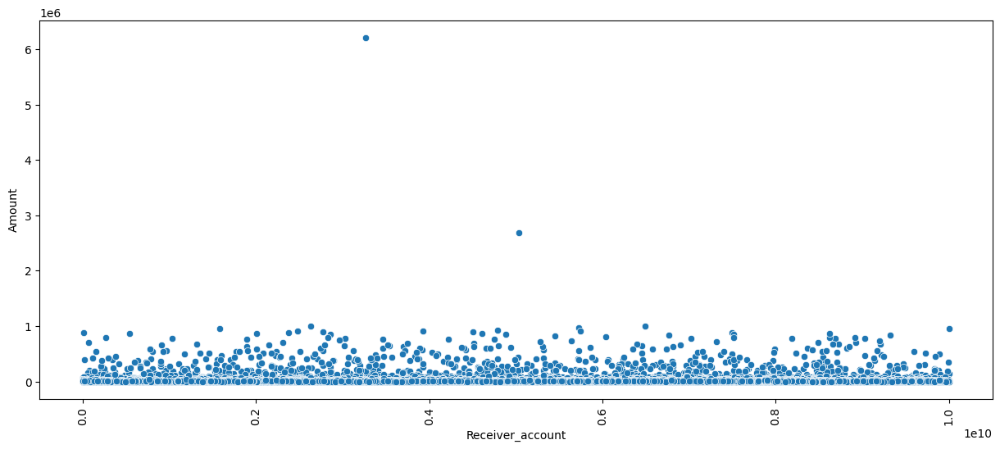

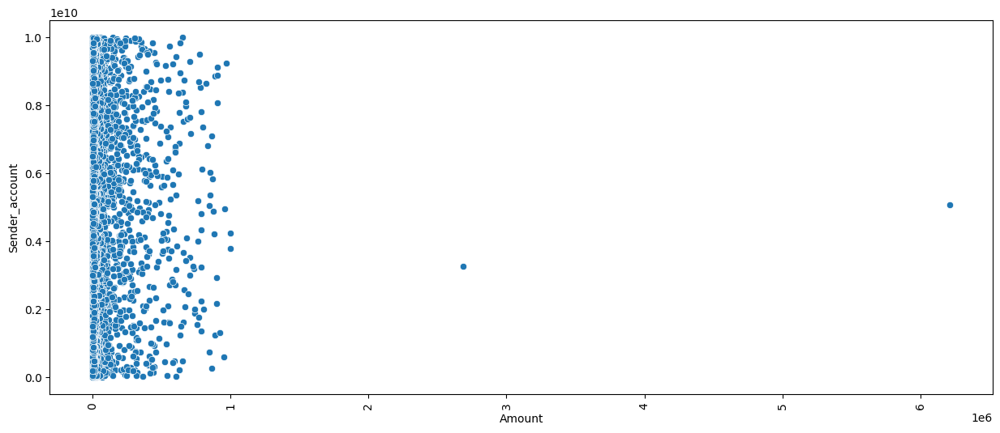

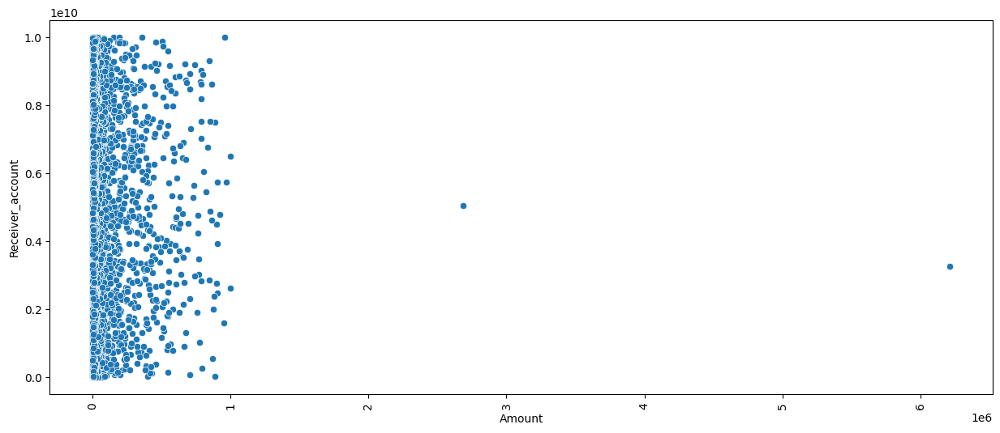

In [43]:
for i in continuous:
    for j in continuous:
        if i != j:
            plt.figure(figsize=(15,6))
            sns.scatterplot(x = df[i], y = df[j], data = df, palette = 'hls')
            plt.xticks(rotation = 90)
            plt.show()

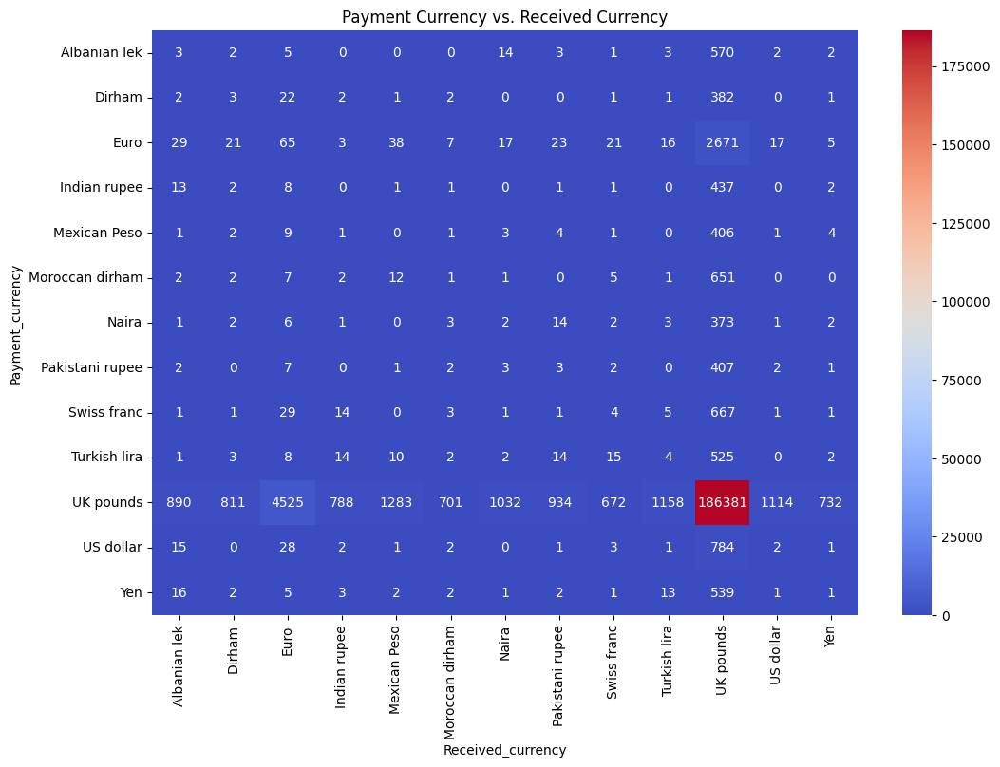

In [44]:
payment_received = pd.crosstab(df['Payment_currency'], df['Received_currency'])
plt.figure(figsize=(12, 8))
sns.heatmap(payment_received, annot=True, cmap='coolwarm', fmt='d')
plt.title('Payment Currency vs. Received Currency')
plt.show()

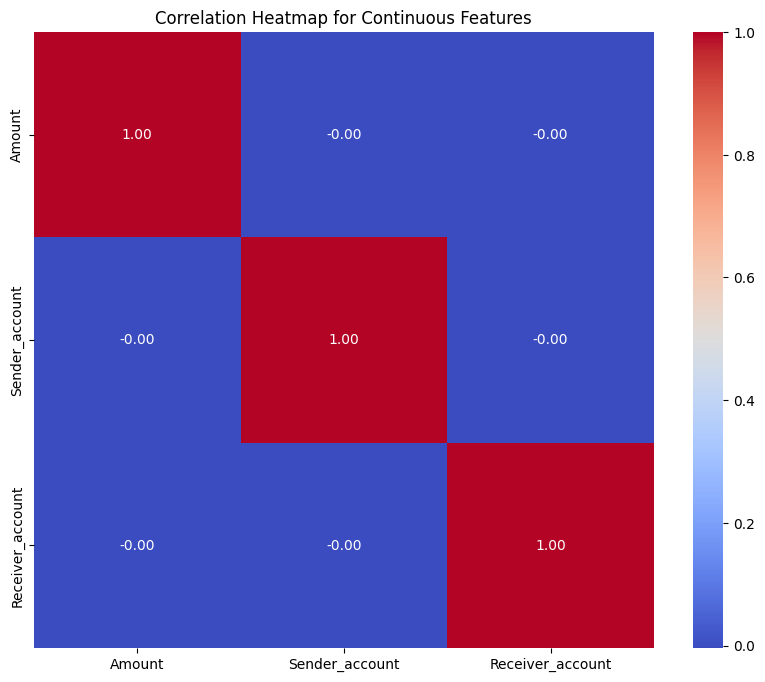

In [47]:
continuous_features = ['Amount', 'Sender_account', 'Receiver_account', 'Time']
plt.figure(figsize=(10, 8))
sns.heatmap(df[continuous_features].corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap for Continuous Features')
plt.show()

In [48]:
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
plt.figure(figsize=(15, 8))
df['Amount'].resample('D').sum().plot(title='Daily Total Transaction Amount')
plt.show()

KeyError: ignored

In [49]:
import pandas as pd

# Example: Correcting a specific known issue
df['Date'] = df['Date'].replace({'2022-10-0': '2022-10-01'}, regex=True)

# More generally, you can use a custom function to handle exceptions
def correct_date(date):
    try:
        return pd.to_datetime(date)
    except ValueError:
        # Handle or log the error, perhaps set a default date or return None
        return pd.NaT  # Not a Time (NaT) for missing or invalid dates

df['Date'] = df['Date'].apply(correct_date)


KeyError: ignored

In [ ]:
# Drop rows with missing or invalid dates if any
df.dropna(subset=['Date'], inplace=True)

# Set 'Date' as the index
df.set_index('Date', inplace=True)

# Plotting
plt.figure(figsize=(15, 8))
df['Amount'].resample('D').sum().plot(title='Daily Total Transaction Amount')
plt.show()


In [50]:
df

,Time,Sender_account,Receiver_account,Amount,Payment_currency,Received_currency,Sender_bank_location,Receiver_bank_location,Payment_type,Is_laundering,Laundering_type
Date,,,,,,,,,,,
2022-10-07,10:35:19,8724731955,2.769355e+09,1459.15,UK pounds,UK pounds,UK,UK,Cash Deposit,0.0,Normal_Cash_Deposits
2022-10-07,10:35:20,1491989064,8.401255e+09,6019.64,UK pounds,Dirham,UK,UAE,Cross-border,0.0,Normal_Fan_Out
2022-10-07,10:35:20,287305149,4.404767e+09,14328.44,UK pounds,UK pounds,UK,UK,Cheque,0.0,Normal_Small_Fan_Out
2022-10-07,10:35:21,5376652437,9.600420e+09,11895.00,UK pounds,UK pounds,UK,UK,ACH,0.0,Normal_Fan_In
2022-10-07,10:35:21,9614186178,3.803337e+09,115.25,UK pounds,UK pounds,UK,UK,Cash Deposit,0.0,Normal_Cash_Deposits
...,...,...,...,...,...,...,...,...,...,...,...
2022-10-14,15:05:59,9309535432,6.036880e+09,1353.14,UK pounds,UK pounds,UK,UK,Cheque,0.0,Normal_Small_Fan_Out
2022-10-14,15:06:00,873235144,8.012946e+09,6522.03,UK pounds,UK pounds,UK,UK,Cheque,0.0,Normal_Fan_Out
2022-10-14,15:06:01,9819086477,6.597292e+09,2851.35,UK pounds,UK pounds,UK,UK,Cheque,0.0,Normal_Small_Fan_Out


In [51]:
df.reset_index(inplace=True)

In [52]:
df

,Date,Time,Sender_account,Receiver_account,Amount,Payment_currency,Received_currency,Sender_bank_location,Receiver_bank_location,Payment_type,Is_laundering,Laundering_type
0,2022-10-07,10:35:19,8724731955,2.769355e+09,1459.15,UK pounds,UK pounds,UK,UK,Cash Deposit,0.0,Normal_Cash_Deposits
1,2022-10-07,10:35:20,1491989064,8.401255e+09,6019.64,UK pounds,Dirham,UK,UAE,Cross-border,0.0,Normal_Fan_Out
2,2022-10-07,10:35:20,287305149,4.404767e+09,14328.44,UK pounds,UK pounds,UK,UK,Cheque,0.0,Normal_Small_Fan_Out
3,2022-10-07,10:35:21,5376652437,9.600420e+09,11895.00,UK pounds,UK pounds,UK,UK,ACH,0.0,Normal_Fan_In
4,2022-10-07,10:35:21,9614186178,3.803337e+09,115.25,UK pounds,UK pounds,UK,UK,Cash Deposit,0.0,Normal_Cash_Deposits
...,...,...,...,...,...,...,...,...,...,...,...,...
210151,2022-10-14,15:05:59,9309535432,6.036880e+09,1353.14,UK pounds,UK pounds,UK,UK,Cheque,0.0,Normal_Small_Fan_Out
210152,2022-10-14,15:06:00,873235144,8.012946e+09,6522.03,UK pounds,UK pounds,UK,UK,Cheque,0.0,Normal_Fan_Out
210153,2022-10-14,15:06:01,9819086477,6.597292e+09,2851.35,UK pounds,UK pounds,UK,UK,Cheque,0.0,Normal_Small_Fan_Out
210154,2022-10-14,15:06:04,1490045067,3.306293e+09,603.90,UK pounds,UK pounds,UK,UK,Cheque,0.0,Normal_Small_Fan_Out


In [53]:
df = pd.get_dummies(df, columns=['Payment_currency', 'Received_currency', 'Payment_type'], drop_first=True)

In [54]:
df

,Date,Time,Sender_account,Receiver_account,Amount,Sender_bank_location,Receiver_bank_location,Is_laundering,Laundering_type,Payment_currency_Dirham,...,Received_currency_UK pounds,Received_currency_US dollar,Received_currency_Yen,Payment_type_Cash Deposit,Payment_type_Cash Withdrawal,Payment_type_Cheque,Payment_type_Credit card,Payment_type_Cross-border,Payment_type_Cross-border Withdrawal,Payment_type_Debit card
0,2022-10-07,10:35:19,8724731955,2.769355e+09,1459.15,UK,UK,0.0,Normal_Cash_Deposits,0,...,1,0,0,1,0,0,0,0,0,0
1,2022-10-07,10:35:20,1491989064,8.401255e+09,6019.64,UK,UAE,0.0,Normal_Fan_Out,0,...,0,0,0,0,0,0,0,1,0,0
2,2022-10-07,10:35:20,287305149,4.404767e+09,14328.44,UK,UK,0.0,Normal_Small_Fan_Out,0,...,1,0,0,0,0,1,0,0,0,0
3,2022-10-07,10:35:21,5376652437,9.600420e+09,11895.00,UK,UK,0.0,Normal_Fan_In,0,...,1,0,0,0,0,0,0,0,0,0
4,2022-10-07,10:35:21,9614186178,3.803337e+09,115.25,UK,UK,0.0,Normal_Cash_Deposits,0,...,1,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
210151,2022-10-14,15:05:59,9309535432,6.036880e+09,1353.14,UK,UK,0.0,Normal_Small_Fan_Out,0,...,1,0,0,0,0,1,0,0,0,0
210152,2022-10-14,15:06:00,873235144,8.012946e+09,6522.03,UK,UK,0.0,Normal_Fan_Out,0,...,1,0,0,0,0,1,0,0,0,0
210153,2022-10-14,15:06:01,9819086477,6.597292e+09,2851.35,UK,UK,0.0,Normal_Small_Fan_Out,0,...,1,0,0,0,0,1,0,0,0,0
210154,2022-10-14,15:06:04,1490045067,3.306293e+09,603.90,UK,UK,0.0,Normal_Small_Fan_Out,0,...,1,0,0,0,0,1,0,0,0,0


In [55]:
df = pd.get_dummies(df, columns=['Sender_bank_location' , 'Receiver_bank_location' , 'Laundering_type'], drop_first=True)

In [56]:
df

,Date,Time,Sender_account,Receiver_account,Amount,Is_laundering,Payment_currency_Dirham,Payment_currency_Euro,Payment_currency_Indian rupee,Payment_currency_Mexican Peso,...,Laundering_type_Normal_Periodical,Laundering_type_Normal_Plus_Mutual,Laundering_type_Normal_Small_Fan_Out,Laundering_type_Normal_single_large,Laundering_type_Over-Invoicing,Laundering_type_Scatter-Gather,Laundering_type_Single_large,Laundering_type_Smurfing,Laundering_type_Stacked Bipartite,Laundering_type_Structuring
0,2022-10-07,10:35:19,8724731955,2.769355e+09,1459.15,0.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2022-10-07,10:35:20,1491989064,8.401255e+09,6019.64,0.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2022-10-07,10:35:20,287305149,4.404767e+09,14328.44,0.0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,2022-10-07,10:35:21,5376652437,9.600420e+09,11895.00,0.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2022-10-07,10:35:21,9614186178,3.803337e+09,115.25,0.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
210151,2022-10-14,15:05:59,9309535432,6.036880e+09,1353.14,0.0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
210152,2022-10-14,15:06:00,873235144,8.012946e+09,6522.03,0.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
210153,2022-10-14,15:06:01,9819086477,6.597292e+09,2851.35,0.0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
210154,2022-10-14,15:06:04,1490045067,3.306293e+09,603.90,0.0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


In [57]:
df.drop(['Date', 'Time', 'Sender_account', 'Receiver_account'], axis=1, inplace=True)

In [58]:
df

,Amount,Is_laundering,Payment_currency_Dirham,Payment_currency_Euro,Payment_currency_Indian rupee,Payment_currency_Mexican Peso,Payment_currency_Moroccan dirham,Payment_currency_Naira,Payment_currency_Pakistani rupee,Payment_currency_Swiss franc,...,Laundering_type_Normal_Periodical,Laundering_type_Normal_Plus_Mutual,Laundering_type_Normal_Small_Fan_Out,Laundering_type_Normal_single_large,Laundering_type_Over-Invoicing,Laundering_type_Scatter-Gather,Laundering_type_Single_large,Laundering_type_Smurfing,Laundering_type_Stacked Bipartite,Laundering_type_Structuring
0,1459.15,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,6019.64,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,14328.44,0.0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,11895.00,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,115.25,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
210151,1353.14,0.0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
210152,6522.03,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
210153,2851.35,0.0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
210154,603.90,0.0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


In [59]:
from sklearn.model_selection import train_test_split

X = df.drop('Is_laundering', axis=1)
y = df['Is_laundering']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify = y, random_state=42)

ValueError: ignored

In [60]:
from sklearn.model_selection import train_test_split

X = df.drop('Is_laundering', axis=1)
y = df['Is_laundering']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, train_size=0.8, random_state=42)

In [61]:
from sklearn.model_selection import train_test_split

X = df.drop('Is_laundering', axis=1)
y = df['Is_laundering']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify = y, random_state=42)

ValueError: ignored

In [62]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [63]:
from sklearn.tree import DecisionTreeClassifier

In [64]:
dt_model = DecisionTreeClassifier(random_state=42)

In [65]:
dt_model.fit(X_train, y_train)

ValueError: ignored

In [66]:
dt_model.fit(X_train, y_train)

ValueError: ignored

In [67]:
feature_importances = dt_model.feature_importances_

AttributeError: ignored

In [68]:
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

NameError: ignored

In [69]:
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

NameError: ignored

In [70]:
top_10_features = feature_importance_df.head(10)
print("Top 10 Features:")
print(top_10_features)

plt.figure(figsize=(10, 6))
plt.barh(top_10_features['Feature'], top_10_features['Importance'], color='skyblue')
plt.xlabel('Feature Importance')
plt.title('Top 10 Features - Decision Tree')
plt.show()

NameError: ignored

In [71]:
y_pred = dt_model.predict(X_test)

AttributeError: ignored

In [72]:
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy:.2f}')
print(f'Confusion Matrix:\n{conf_matrix}')
print(f'Classification Report:\n{classification_rep}')

NameError: ignored

In [73]:
from sklearn.ensemble import RandomForestClassifier

In [74]:
rf_classifier = RandomForestClassifier(n_estimators=10, random_state=42)

In [75]:
rf_classifier.fit(X_train, y_train)

ValueError: ignored

In [76]:
y_pred = rf_classifier.predict(X_test)

AttributeError: ignored

In [77]:
accuracy_rf = accuracy_score(y_test, y_pred)
conf_matrix_rf = confusion_matrix(y_test, y_pred)
classification_rep_rf = classification_report(y_test, y_pred)

print(f'Random Forest Test Accuracy: {accuracy_rf:.2f}')
print(f'Random Forest Confusion Matrix:\n{conf_matrix_rf}')
print(f'Random Forest Classification Report:\n{classification_rep_rf}')

NameError: ignored

In [78]:
top_feature_names = [
    'Laundering_type_Normal_Fan_In',
    'Laundering_type_Normal_Small_Fan_Out',
    'Laundering_type_Normal_Fan_Out',
    'Laundering_type_Normal_Group',
    'Laundering_type_Normal_Cash_Withdrawal',
    'Laundering_type_Normal_Cash_Deposits',
    'Laundering_type_Normal_Periodical',
    'Laundering_type_Normal_Mutual',
    'Laundering_type_Normal_Plus_Mutual',
    'Laundering_type_Normal_Foward'
]

In [79]:
X_train = X_train[top_feature_names]
X_test = X_test[top_feature_names]

In [80]:
dt_model.fit(X_train, y_train)

ValueError: ignored

In [81]:
y_pred = dt_model.predict(X_test)

AttributeError: ignored

In [82]:
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy:.2f}')
print(f'Confusion Matrix:\n{conf_matrix}')
print(f'Classification Report:\n{classification_rep}')

NameError: ignored

In [84]:
rf_classifier.fit(X_train, y_train)

ValueError: ignored

In [85]:
y_pred = rf_classifier.predict(X_test)

AttributeError: ignored

In [86]:
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy:.2f}')
print(f'Confusion Matrix:\n{conf_matrix}')
print(f'Classification Report:\n{classification_rep}')

NameError: ignored

# THANK YOU!
# CODE PRACTICED BY KOLLURU SAHARSH